# Beyond Linearity

"People take the longest possible paths, digress to numerous dead ends, and make all kinds of mistakes. Then historians come along and write summaries of this messy, nonlinear process and make it appear like a simple, straight line." 
Dean Kamen

We have until now seen the power of the Laplace operator, and how it captures the phenomenon of diffusion and, using the stream-function approach, the solution of the Stokes equation for the case of homogeneous viscosity. But what happens when the material strength (viscosity, elasticity) or diffusive parameters (thermal or hydraulic conductivity) of the material are not homogeneous? 

For example in the example shown using the biharmonic equation the spheres could be more viscous than the surrounding fluid (e.g. crystal in magma, strong inclusion in the mantle) or much less viscous (e.g. gas bubble in magma or in water). In this case the formulation of the stress changes and the derivative of the non-homogeneous and potentially non-linear parameters enter into the equations to solve. We will see in this chapter that, while linear problems could be approached from similarly many directions, only some well designed algorithms can deal with these non-linearities.

## Operator form of the Stokes equation

Let's go back to the definition of the momentum equation for Stokes Flow, but let's introduce now the concept of Stress. Conceptually Stress is the analogue in continuum mechanics of what the force is in Newtonian mechanics, however in continuum mechanics the forcing term can be in general split in two, a $bulk$ term, that is commonly represented as a function of the pressure, and a $deviatoric$ term that describes the deviation from the bulk effects. This is particular important at very high pressure as in the deep Earth's interiors where the deviatoric stress are very small compared to the pressure, however they almost totally control the local flow low. Formally, by calling the total stress tensor $\tau$ and the deviatoric one $\sigma$ the two terms are written as: 

\begin{equation}
\tau_{ij} = \sigma_{ij} - p \delta_{ij}
\end{equation}  

where the minus conventionally indicates that the compressional pressures are positive. 

The momentum equation for a gravity driven system, analogously to $F = mg$, can be written by splitting deviatoric stress and the pressure:

\begin{equation}
\frac{\partial \sigma_{ij}}{\partial x_j} - \frac{\partial p}{\partial x_i} = - \rho g_i 
\label{eq:Mom_def}
\end{equation}  

This is the general Stokes equation that we will have to solve for any constitutive laws that relates our stress with the material deformation. Given that stress is related to deformation (strain rate), it appears from this expression that the most general way to solve Stokes low implies the simultaneous solution of the flow law (given by the local description of the velocities $v_x$, $v_y$, $v_z$) combined with the local solution of the pressure $p$. 

In a viscous (or creeping system) like the Earth's mantle, or a magma chamber, the relationship between the strain rate $\dot\epsilon$, describing material deformation, and the deviatoric stress $\sigma$ is defined with the following relationship: 

\begin{equation}
	\sigma_{ij}=2 \eta \dot\epsilon_{ij}
\label{eq:Stokes_def}
\end{equation}  

Since in two-dimensions we want to solve for three unknowns ($v_x$, $v_y$ and $p$), the two-dimensional Stokes' Equation needs an extra one to close the system. As is standard in Geophysical Fluid-dynamics, we will use the incompressible continuity equation. By combining continuity and momentum equations, one obtains (in 2D) a $3 \times 3$ matrix operator that looks like:

\begin{equation}
\begin{bmatrix}
\frac{\partial}{\partial x} \left( 2 \eta \frac{\partial}{\partial x} \right) + \frac{\partial}{\partial y} \left( \eta \frac{\partial}{\partial y} \right) & &
\frac{\partial}{\partial y} \left( \eta \frac{\partial}{\partial x} \right) & &
-\frac{\partial}{\partial x} \\
\frac{\partial}{\partial x} \left( \eta \frac{\partial}{\partial y} \right) & &
\frac{\partial}{\partial x} \left( \eta \frac{\partial}{\partial x} \right) + \frac{\partial}{\partial y} \left( 2 \eta \frac{\partial}{\partial y} \right) & & -\frac{\partial}{\partial y} \\
\frac{\partial}{\partial x} & & \frac{\partial}{\partial y} & & 0
\end{bmatrix}
\cdot
\begin{bmatrix}
v_x \\
v_y \\
p 
\end{bmatrix}
= 
\begin{bmatrix}
	-\rho g_x \\
	-\rho g_y \\
	0 
\end{bmatrix}
\label{eq:fullStokesMatrix}
\end{equation}

Where one observes that some ${non-linear}$ laplacian terms have $2\eta$ and others $\eta$ due to the definition of strain rate. If the viscosity is constant, this reduces to the equations of linear Stokes, as we looked at in the past chapter, due to the simplification that  $\frac{\partial}{\partial x} \left( \frac{\partial}{\partial y} \right) =\frac{\partial}{\partial y} \left( \frac{\partial}{\partial x} \right)$, combined with the continuity equation. In this case the operator formulation takes the form:

\begin{equation}
\label{fullOperatorConstantViscosity}
\begin{bmatrix}
\eta \frac{\partial}{\partial x} \left( \frac{\partial}{\partial x} \right) + \eta \frac{\partial}{\partial y} \left( \frac{\partial}{\partial y} \right) & &
0 & &
-\frac{\partial}{\partial x} \\
0 & &
\eta \frac{\partial}{\partial x} \left( \frac{\partial}{\partial x} \right) + \eta \frac{\partial}{\partial y} \left( \frac{\partial}{\partial y} \right) & & -\frac{\partial}{\partial y} \\
\frac{\partial}{\partial x} & & \frac{\partial}{\partial y} & & 0
\end{bmatrix}
\cdot
\begin{bmatrix}
	v_x \\
	v_y \\
	p 
\end{bmatrix}
= 
\begin{bmatrix}
	-\rho g_x \\
	-\rho g_y \\
	0 
\end{bmatrix}
\end{equation}

This last form is easier to write but not necessary easy to solve, as the next section illustrates.

## Implementation of the Homogeneous Stokes Equation

The solution of this last system should be the same of the streamline approach. Let's test it using our operator approach. Like we built a $nxp \times nyp$ operator in the biharmonic section, to find the stream-function, here will have to build a $3*nxp \times 3*nyp$ operator to simultaneously find velocity and pressure. I will assume the same density anomaly as earlier and only show how to solve the numerical problem and a homogeneous viscosity equal to $1.0$.

In order to do so we need first to recreate the functions that we introduced in the previous lecture.

In [2]:
import numpy as np
import scipy.sparse as sparse
import scipy.sparse.linalg as la

def buildSparseOperatorXaxis(nx,ny,k1,k2):
    nx1=nx-1
    firstDiag=np.ones(nx*ny,float)*k1
    secondDiag=np.ones(nx*ny,float)*k2
    offsets=np.array([0,ny])
    return ( sparse.dia_matrix(([firstDiag,secondDiag],offsets), shape=(nx1*ny,nx*ny)).tocsr() )           

def buildSparseOperatorYaxis(nx,ny,k1,k2):
    ny1=ny-1
    firstDiag=np.ones(ny,float)*k1
    secondDiag=np.ones(ny,float)*k2
    offsets=np.array([0,1])
    block = sparse.dia_matrix(([firstDiag,secondDiag],offsets), shape=(ny1,ny)).tocsr()
    return (sparse.kron(sparse.eye(nx),block))

# Functional approach to the calculation of the Laplacian
def sparseGradientOperator(nxp,nyp,dx,dy):
    DxOp = buildSparseOperatorXaxis(nxp,nyp-1,-1.0/dx,1.0/dx)
    DyOp = buildSparseOperatorYaxis(nxp-1,nyp,-1.0/dy,1.0/dy)
    sideXOp=buildSparseOperatorYaxis(nxp,nyp, 0.5, 0.5)
    sideYOp=buildSparseOperatorXaxis(nxp,nyp, 0.5, 0.5) 
    return(DxOp.dot(sideXOp),DyOp.dot(sideYOp)) 

def MeshToVolume(nxp,nyp):
    return buildSparseOperatorYaxis(nxp-1,nyp,0.5,0.5).dot( buildSparseOperatorXaxis(nxp,nyp,0.5,0.5) )

def VolumeToMesh(nxp,nyp):
    return buildSparseOperatorXaxis(nxp,nyp,0.5,0.5).transpose().dot( buildSparseOperatorYaxis(nxp-1,nyp,0.5,0.5).transpose() )        

def sparseLaplacianOperator(nxp,nyp,dx,dy): 
    (cellDxOp,cellDyOp)=sparseGradientOperator(nxp,nyp,dx,dy) 
    (cellDxOpSmall,cellDyOpSmall) = sparseGradientOperator(nxp-1,nyp-1,dx,dy) 
    return(cellDxOpSmall.dot(cellDxOp)+cellDyOpSmall.dot(cellDyOp))

def addBC(operatorWithoutBC,nxp,nyp): # add Boundary Conditions nxy=nxp*nyp
    nxy=nxp*nyp
    operatorWithBC=sparse.lil_matrix((nxy,nxy))
    indexes = np.arange(nxy)
  # selects only the interior points
    oldLines = (indexes>=nyp) * (indexes<=nxy-nyp) * (indexes % nyp != 0) * (indexes % nyp != nyp-1) 
    operatorWithBC[oldLines,:]=operatorWithoutBC[:,:] 
    operatorWithBC[~oldLines,~oldLines]=1.0
    return operatorWithBC


Now we can introduce the same model calculated previously, with the same gravity configuration and density distribution.

In [7]:
nxp=51; nxc=nxp-1; xTot=1.0; 
nyp=51; nyc=nyp-1; yTot=1.0; 
dx=xTot/nxc; xMin=-xTot/2.0; xMax=xTot/2.0
dy=yTot/nyc; yMin=-yTot/2.0; yMax=yTot/2.0

visc = 1.; gy=-10.; gx=0.

#allocate arrays
X=np.arange(nxp)*dx+xMin; Y=np.arange(nyp)*dy+yMin

# initial conditions, create two density anomalies
density=np.zeros((nxp,nyp),float) 
cx1=-0.0;cx2=0.1;cy1=-0.0;cy2=0.3;radius=0.1; #center and radius
XX=np.outer(X,np.ones(nyp));YY=np.outer(np.ones(nxp),Y);
anomalyIndexes = ((XX-cx1)**2+(YY-cy1)**2<radius**2*2) 
#anomalyIndexes+= ((XX-cx2)**2+(YY-cy2)**2<radius**2*2) 
density[anomalyIndexes]=1.0 

nxy=nxp*nyp
(Dx,Dy) = sparseGradientOperator(nxc,nyc,dx,dy)

#The operators are made square by applying Dirichlet BC
Dx = addBC( Dx.dot( MeshToVolume(nxp,nyp) ),nxp,nyp ) 
Dy = addBC( Dy.dot( MeshToVolume(nxp,nyp) ),nxp,nyp )

L = addBC( sparseLaplacianOperator(nxp,nyp,dx,dy),nxp,nyp)

fullStokesOperator = sparse.bmat([[L, None, -Dx], [None, L, -Dy], [Dx,Dy,None]]).tocsr()

rhs = np.zeros((3*nxy), float) # right hand side
rhs[0:nxy]= -gx*density.reshape(nxy)
rhs[nxy:2*nxy]= -gy*density.reshape(nxy)

solution = la.spsolve(fullStokesOperator,rhs) # solve 

vx=solution[0:nxy].reshape(nxp,nyp)
vy=solution[nxy:2*nxy].reshape(nxp,nyp)
p=solution[2*nxy:3*nxy].reshape(nxp,nyp)

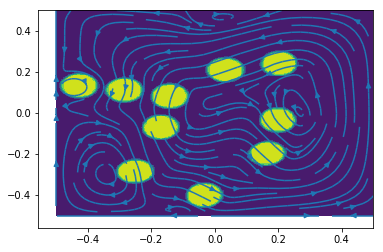

In [17]:
import matplotlib.pyplot as plt
plt.contourf(X,Y,density.T.reshape(nxp,nyp))
plt.streamplot(X,Y,vx.T,vy.T)
plt.show()

Let's carefully observe how the solution was found. First of all the derivative operators had to made square in order the solution matrix to be entirely square. To do so $Dx$ and $Dy$ have been calculated at the volume centers ($nxc$ and $nyc$) and then applied (dot) to a projection of the rhs from the mesh to the volume. Here the Boundary conditions are applied to the $Dx$ and $Dy$ operators as Dirichlet Boundary Conditions, which means that the velocity (in this case zero) at the boundary is kept constant. Alternative BC, e.g. ${free slip}$, as for the streamline solution, can be applied as well. But that is not the problem. Let's look at the pressure to see what the issue is.

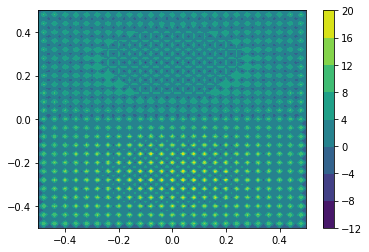

In [9]:
plt.contourf(X,Y,p.T.reshape(nxp,nyp));plt.colorbar()
#plt.streamplot(X,Y,vx.T,vy.T)
plt.show()

A first look at the pressure field shows that something went wrong. In fact the **checkerboard** pattern that we just found, is a very general type of instability, that pops up at nearly every attempt to solve two or more equations on one grid. To understand why this is happening is very important in order to build a working multivariable solver, such as this one.

From a purely numerical point of view what we observe is that two incorrect solutions on the same grid can superpose one to each other in order and still solve the coupled system of equations by carefully compensating each other on *alternating* nodes. In other words if I would solve the equation on the even nodes and uneven nodes separately, I would obtain two solutions, one shifted from the other, but both solving my discretized equations. There is a large wealth of techniques for solving this problem, but the most common one is to solve the momentum equation and the continuity equations on different grids. 

In our case, it is sufficient to solve the velocities on the nodes and the pressure at the center of each cell. Doing so requires to change our matrix, since the number of cells is $nxc \times nyc$, which is $nyp+nxp-1$ less than the number of nodes $nxp \times nyp$. We have therefore to solve our system for $2 nxp \times nyp$ velocity unknowns and for $nxc \times nyc$ pressure unknowns. 

__ Exercise:  Write a $linearFullStokesOperator$ python function that creates the operator that solves the full Stokes equation in 2D in function of $nxp$, $nyp$, $dx$ and $dy$, calculating velocity and pressure for the case of constant viscosity, using the routines described here above. It can be written in a clear manner with only 6-7 lines of code.__

## The finite volume method

<img src="finite-volume-sketch.png" width="500">
    Sketch of the of the indices and of the positions where the continuity, the x-momentum and the y-momentum equations are calculated. The mid indexes ($\frac{1}{2}$ and $\frac{3}{2}$ indicate the center between two edges of the volume. By calculating the finite volume at the center of each side one is also implicitamente integrating the momentum equations on each side. It is possible to show that this choice makes this algorithm second-order accurate.

At the first sight, it might seem that the origin of the instability in calculating pressure lies in some minor error done for solving these equations. Instead  in the side averaging used to calculate the gradient at the center of the cell. This strategy was in fact the best to minimize the error by calculating the x-derivative of $v_x$ and y-derivative of $v_y$, however it suffers of  information reduction. In fact while calculating the gradient of a generic field on the nodes of a lattice at the cell center, we are automatically reducing the number of points in which the information is defined from $nx \times ny$ to $(nx-1) \times (ny-1)$. 

The appearance of the instability in the calculation of the pressure has emerged to computational fluid-dynamicists as early as the seventies years of the twenty centuries and many solutions have been put forward. It is possible to show that the oscillatory instability is a form of *over-fitting*, for which the most common remedy is regularization. Numerically regularization is implemented by using the **Penalty** method, i.e. a perturbation to the zero terms of the operator in the full operator (vx,vy,p). This technique is however quite complex, therefore I will show here a simpler one, based on discretizing the three equations in three different locations of the numerical domain. 

This approach was one of earliest successful solutions to the pressure stabilization problem and was introduced by Patankar and Spalding in 1972 and exposed in detail in 1980, in the so-called SIMPLE algorithm. This consists in calculating a correction term to the velocity solution, and iterate until convergence is reached. This allows achieving the solution very rapidly and could be implemented with the operator approaches. It is proposed as an advanced exercise. More detailed information on how to implement a generic finite volume discretization are in classic textbooks such as Anderson, 1995; Ferziger, 2012, or modern implementations applied to the geosciences such as Dabrowski, 2008. 

The  **Finite Volume Method (FVM)** is also a more physical way than the Finite Differences to understand the how we are solving our equations. Although ultimately the discrete implementation of the Finite Volume method is very similar (and in some cases identical) to the one emerging from the Finite Difference method, the Finite Volume approach is based on an integral in the volume. 

FVM is based on an equilibrium law for an entire cell, not in every node. We have already seen when introducing $operators$ that it is physically more sound and numerically more reliable to solve the continuity equation at the center of a cell. From the work on the continuity equation we observed that the difference between the velocities calculate at the center of each side are the best representation of the flux through the cell. This is another way to understand the importance of having a operator that average the values of $v_x$ and $v_y$ half cell in the $x$ and $y$ directions, respectively. 

The implementation of the Finite Volume is simpler for a more compact equation, therefore I will show first how to discretize the pressure operator of the x-momentum equation, $\frac{\partial}{\partial x} p$. 

\begin{equation}
\frac{p_{i+\frac{3}{2},j+\frac{1}{2}} - p_{i+\frac{1}{2},j+\frac{1}{2}}}{\Delta x}
\end{equation}

where the meaning of the half indexes, $\frac{1}{2}$ indexes are a simple way in which mid-points are described in the Finite Volume/ Finite Difference literature. It is important to observe that this term is calculated in the point $i+1,j+\frac{1}{2}$ and this is where we will have to calculate all the other terms. Let's look now at the second term of the x-momentum equation $\frac{\partial}{\partial y} \left( \eta \frac{\partial}{\partial x} \right) v_y$: 

\begin{equation}
\frac{\eta^{i+1,j+1} \left(v_y^{i+\frac{3}{2},j+1}-v_y^{i+\frac{1}{2},j+1}\right) - \eta^{i+1,j} \left(v_y^{i+\frac{3}{2},j}-v_y^{i+\frac{1}{2},j}\right)}{\Delta x \Delta y}
\end{equation}

where the key point is that the viscosity is calculated in the point where the intermediate derivate which is also centered in $i+1,j+\frac{1}{2}$. And finally the more complex term $\frac{\partial}{\partial x} \left( 2 \eta \frac{\partial}{\partial x} \right) + \frac{\partial}{\partial y} \left( \eta \frac{\partial}{\partial y} \right) v_x$:

\begin{align}
2 \frac{\eta^{i+\frac{3}{2},j+\frac{1}{2}} \left(v_x^{i+2,j+\frac{1}{2}}-v_x^{i+1,j+\frac{1}{2}}\right) -\eta^{i+\frac{1}{2},j+\frac{1}{2}} \left(v_x^{i+1,j+\frac{1}{2}}-v_x^{i,j+\frac{1}{2}}\right)}{\Delta x ^2} +\\
\frac{\eta^{i+1,j+1} \left( v_x^{i+1,j+\frac{3}{2}} - v_x^{i+1,j+\frac{1}{2}} \right) - \eta^{i+1,j} \left( v_x^{i+1,j+\frac{1}{2}} - v_x^{i+1,j-\frac{1}{2}} \right) }{\Delta y ^2}
\end{align}

Where the position where the viscosities are taken is naturally indicated in the sketch at the beginning of the section. It is not necessary to write the formulation in the y-direction as it is perfectly symmetrical to the x-direction. The discretization of the continuity equation, that closes the system, has been already extensively analyzed in other chapters.

## Implementation of the Non-homogeneous Stokes Equation

The most straightforward solution to this information problem is to write a pure finite-volume, cell-centered operator for the Stokes solver for non-linear flow. Here I show an entirely vectorized and tested version:

In [15]:
def fullStokesOperatorNew(viscosity,dx,dy,nx,ny):

    nxy=nx*ny
       
    indexes = np.arange(nxy)
    XMinInd = (indexes<ny); 
    XMaxInd = (indexes>=nxy-ny)
    YMinInd = (indexes % ny == 0) 
    YMaxInd = (indexes % ny == ny-1)
    
    # Viscosities
    eta = viscosity.reshape(nxy) # stretch the array
    etaXmom = np.ones(nxy,np.float64); etaXmom[~XMinInd] = eta[~XMaxInd]; 
    etaYmom = np.ones(nxy,np.float64); etaYmom[~YMinInd] = eta[~YMaxInd]; 
            
    # Harmonic averages at cell centers
    ind1 = (~XMinInd)*(~YMinInd); ind2 = (~XMinInd)*(~YMaxInd) 
    ind3 = (~XMaxInd)*(~YMaxInd); ind4 = (~XMaxInd)*(~YMinInd)     
    etaHarmonic = (eta[ind1]*eta[ind2]*eta[ind3]*eta[ind4])**0.25

    # cell centered values
    etaCell = np.ones(nxy,np.float64); etaCell[ind1]=etaHarmonic; 
    eta_XP =  np.ones(nxy,np.float64); eta_XP[ind4]=etaHarmonic;
    eta_YP =  np.ones(nxy,np.float64); eta_YP[ind2]=etaHarmonic;
    
    # here starts the x-momentum
    ind = (~XMinInd) # exclude x==0
    
    # 2 d(eta dvx/dx)/dx + d(eta dvx/dy)/dy
    offsets=[ny,1,0,-1,-ny]; 
    diags=np.zeros((5,nxy),np.float64)
    diags[0,ind] = +2.0 * etaXmom[ind]/dx**2
    diags[1,ind] = +1.0 * etaCell[ind]/dy**2 #-1
    diags[2,~ind] = 1.0;  # for x==0 vx velocities are imposed
    diags[2,ind] = -2.0 * (eta[ind]+etaXmom[ind])/dx**2  # 2(d2 vx/dx2) 
    diags[2,ind] += -(etaCell[ind]+eta_YP[ind])/dy**2 # d2 vx/dy2
    diags[3,ind] = +1.0 * eta_YP[ind]/dy**2  #+1
    diags[4,ind] = +2.0 * eta[ind]/dx**2
    Mx_vx = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()

    # d(eta dvy/dx)/dy 
    offsets=[-1+ny,-1,+ny,0]; 
    diags=np.zeros((4,nxy),np.float64);
    diags[0,ind] = -eta_YP[ind]/dx/dy
    diags[1,ind] = +eta_YP[ind]/dx/dy 
    diags[2,ind] = +etaCell[ind]/dx/dy  
    diags[3,ind] = -etaCell[ind]/dx/dy
    Mx_vy = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()

    # dp/dx
    offsets=[0,+ny]; 
    diags=np.zeros((2,nxy),np.float64)
    diags[0,ind] = -np.ones(nxy,np.float64)[ind]/dx
    diags[1,ind] = +np.ones(nxy,np.float64)[ind]/dx
    Mx_p = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()


    #y-momentum
    ind = (~YMinInd) #exclude y==0

    # d(vx/dy)/dx 
    offsets=[-ny+1,-ny,+1,0]; 
    diags=np.zeros((4,nxy),np.float64)
    diags[0,ind] = -eta_XP[ind]/dx/dy
    diags[1,ind] = +eta_XP[ind]/dx/dy 
    diags[2,ind] = +etaCell[ind]/dx/dy  
    diags[3,ind] = -etaCell[ind]/dx/dy
    My_vx = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()

    # (d2 vy/dx2) + 2 (d2 vy/dy2)
    offsets=[ny,1,0,-1,-ny]; 
    diags=np.zeros((5,nxy),np.float64)
    diags[0,ind] = +1.0*etaCell[ind]/dx**2
    diags[1,ind] = +2.0*etaYmom[ind]/dy**2 #-1
    diags[2,~ind] = 1.0 
    diags[2,ind] = -2.0 * (eta[ind]+etaYmom[ind])/dy**2  # 2(d2 vx/dx2) 
    diags[2,ind] += -(etaCell[ind]+eta_XP[ind])/dx**2 # d2 vx/dy2
    diags[3,ind] = +2.0*eta[ind]/dy**2  #+1
    diags[4,ind] = +1.0*eta_XP[ind]/dx**2
    My_vy = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()

    # dp/dy
    offsets=[0,+1]; 
    diags=np.zeros((2,nxy),np.float64)
    diags[0,ind] = -np.ones(nxy,np.float64)[ind]/dy
    diags[1,ind] = +np.ones(nxy,np.float64)[ind]/dy
    My_p = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()


    #continuity
    ind = ~(XMinInd * YMinInd) 
    
    # dvx/dx
    offsets=[0,-ny]
    diags=np.zeros((2,nxy),np.float64)
    diags[0,ind] = -np.ones(nxy,np.float64)[ind]/dx
    diags[1,ind] = +np.ones(nxy,np.float64)[ind]/dx
    P_vx = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()
    
    # dvy/dy
    offsets=[0,-1]
    diags=np.zeros((2,nxy),np.float64)
    diags[0,ind] = -np.ones(nxy,np.float64)[ind]/dy
    diags[1,ind] = +np.ones(nxy,np.float64)[ind]/dy
    P_vy = sparse.dia_matrix((diags,offsets), shape=(nxy,nxy) ).transpose().tocsr()

    # identity for pressure at one corner
    P_p = sparse.coo_matrix((([1]),([0],[0])),shape=(nxy,nxy)).tocsr()   

    return sparse.bmat([[Mx_vx, Mx_vy, Mx_p], [My_vx, My_vy, My_p], [P_vx,P_vy,P_p]]).tocsr()  
    

The function *fullStokesOperatorNew* is entirely vectorized, therefore every single operation can be optimized as any linear algebra operation. The function is longer than others that we analyzed before because it combines the calculation of nine sub-matrices in one routine. A quick look, however, shows how the same strategy is applied several times through its entire implementation. One could split it in smaller pieces (and it would be a useful exercise for the reader to do) but we can analyze it in detail and see that its overall structure not difficult to grasp:

1) *XMinInd*, *XMaxInd*, *YMinInd*, *YMaxInd* are arrays of indexes that comprises one of the four *edges* of the domain, i.e. minimum and maximum $x$ and $y$. In this way one can immediately point to the remaining nodes with the symbol $\sim$.

2) Viscosity averages are either shifted (for the momentum equation) or a cell-centered harmonic average is caculated. This helps dealing with sharp viscosity variations. Once averaged, using indexes one has three types of averages: (i) cell centered; (ii) along $x$, (iii) along $y$. 

3) Second derivatives are built using the traditional $a_{n-1}-2a_n+a_{n+1}$ formulation, however the coefficient of the three values are weighted in function of viscosity, by combining the averages calculated in the domain.

4) Each of the nine sub-matrices has been built using the `dia_matrix()` function of `NumPy.sparse`. This allows fast and efficient matrix building, minimization of memory occupation and guarantees that the final matrix is the smallest possible.

5) Every submatrix is transposed when the `dia_matrix()` is created. This is due to the fact that the *offset* in building sparse matrices in NumPy shifts the diagonal only up and down, not laterally. Transposing the matrix overcomes this limitation in the Python library itself. 

The most critical part of the routine is the careful averaging of the viscosity. Here the harmonic average is chosen because it guarantees weakening if low viscosity is present, which in turns allows for example better modeling sharp variations of viscosity. For example in the example that follows. The reader is invited to explore other averaging strategies to consider in which case alternative choices might be more correct. 

There are many alternative to this matrix construction. For example it is possible to introduce ghost nodes, and introduce a variety of different boundary conditions. However this goes beyond the scope of this text. Let's look instead now at how to combine this powerful routine with scaling  instead the efficiency of this code on several setup and its scaling with problem size. We test to start with the flow relative to a sphere immersed in a fluid in a squared domain. 

## Example: Long-range interaction

Geodynamics span through the scales, from the micro to the macro-scale and one of the main uses of numerical modeling is to allow extrapolate from a small scale, complex and heterogeneous media, a more homogeneous average behavior. Many particles that are highly packed in a highly viscous fluid filled domain experience a strong mutual force through the surrounding fluid. These particles can be strong or weak, but they will always interact. In the advanced part of the book I show that this is correct with some more mathematical details. Since particle boundary have extremely sharp viscosity and density gradients, they are perfect to test the validity of the finite volume implementation introduced in this chapter. 

Let's start with a larger number of particles that the two that we used for the few tests above. For example with 20 or 30 particles randomly placed in a box, we should observe a collective dynamics. Will we observe that they all move as one? Or will they form clusters? Or as a distributed rain? Let's write a simple routine that generates $n$ hard spheres in a box, with a certain preimposed *filling* parameter that indicates what is the ratio of the volume occupied by the sphere. To do that is a simple exercise to break from the heavy and difficult implementations of a solver. Still it is not trivial because we have to find a clever way to implement a check that the spheres do not overlap and to re-randomly deploy the one of the two that overlaps. The following routine will do the job by building a distance matrix, using the ${scipy.spatial}$ library. 

In [12]:
from scipy.spatial import distance

def deploySpheres(sNumber,filling,minDistance,xMin,yMin,xTot,yTot):
    sRadius = (filling*xTot*yTot/sNumber/np.pi)**0.5 
    sCenters = np.arange(sNumber*2).reshape(sNumber,2)*1e-5 #initialize the array
    
    farSpheres = False #True when non overlapping spheres
    while not farSpheres:
        k = distance.squareform(distance.pdist(sCenters)) 
        critDistance = 2*sRadius+minDistance
        recCenters = np.where((k<critDistance) & (k>1e-6))[0]
        sCenters[recCenters]=np.random.rand(len(recCenters),2)
        sCenters[recCenters] *= (xTot-critDistance,yTot-critDistance)
        sCenters[recCenters] += (xMin+2*minDistance,yMin+2*minDistance)
        farSpheres = not len(recCenters)    
        print('finding sphere position.',len(recCenters),'more to go')    

    return(sCenters,sRadius)

With this routine we can create a simple model that simulates the evolution of, for example, 40 very stiff particles that occupy $10\%$ of the volume (i.e. small particles distributed around). In order to impose stiffness within the inhomogeneous formulation above, we have to impose a viscosity two orders of magnitude greater than the surrounding fluid. 
Before starting let's reintroduce the routines that we created for the advection of the particles. Now we will need them in order to follow the flow of our nonliner system:

In [13]:
def deployParticles(nx,ny,dx,dy,particlesOrder,X,Y):
    # Arit an array for the particles
    particlesPerCell=particlesOrder*particlesOrder
    particlesNumber=particlesPerCell*(nx-1)*(ny-1)
    xTemp = X[0]+(np.arange((nx-1)*particlesOrder)+0.5)*dx/particlesOrder
    yTemp = Y[0]+(np.arange((ny-1)*particlesOrder)+0.5)*dy/particlesOrder
    xp, yp = np.meshgrid(xTemp, yTemp)
    xp = xp.reshape(particlesNumber)
    yp = yp.reshape(particlesNumber)
    return (particlesNumber,xp,yp)   

def calculateWeightsBilinear(xt,yt,X,Y,cIX,cIY,w1,w2,w3,w4,n,dx,dy):
    w1[0:n]=(1-(np.abs(xt[0:n] -X[cIX[0:n]])/dx))*(1-(np.abs(yt[0:n] -Y[cIY[0:n]])/dy))
    w2[0:n]=(1-(np.abs(xt[0:n] -X[cIX[0:n]+1])/dx))*(1-(np.abs(yt[0:n] -Y[cIY[0:n]])/dy))
    w3[0:n]=(1-(np.abs(xt[0:n] -X[cIX[0:n]])/dx))*(1-(np.abs(yt[0:n] -Y[cIY[0:n]+1])/dy))
    w4[0:n]=(1-(np.abs(xt[0:n] -X[cIX[0:n]+1])/dx))*(1-(np.abs(yt[0:n] -Y[cIY[0:n]+1])/dy))
    return (w1,w2,w3,w4)

def calculateWeightsArithmetic(xt,yt,X,Y,cIX,cIY,w1,w2,w3,w4,particlesNumber,dx,dy):
    d=(dx**2+dy**2)**0.5
    w1[:]=1-((xt[:] -X[cIX[:]])**2+(yt[:] -Y[cIY[:]])**2)**0.5/d
    w2[:]=1-((xt[:] -X[cIX[:]+1])**2+(yt[:] -Y[cIY[:]])**2)**0.5/d
    w3[:]=1-((xt[:] -X[cIX[:]])**2+(yt[:] -Y[cIY[:]+1])**2)**0.5/d
    w4[:]=1-((xt[:] -X[cIX[:]+1])**2+(yt[:] -Y[cIY[:]+1])**2)**0.5/d
    return (w1,w2,w3,w4)

def projectParticlesToLattice_Harmonic(w1,w2,w3,w4,cIX,cIY,f,ft,pw):
    # important: f anf tw have to be allocated before calling this function! 
    (nxp,nyp)=f.shape; nxc=nxp-1; nyc=nyp-1
    f[:,:]=0.0; pw[:,:]=0.0
    cIG=cIY+nyc*cIX  

    f[0:nxc,0:nyc]+=np.bincount(cIG,weights=w1/ft).reshape(nxc,nyc)    
    f[1:nxp,0:nyc]+=np.bincount(cIG,weights=w2/ft).reshape(nxc,nyc)
    f[0:nxc,1:nyp]+=np.bincount(cIG,weights=w3/ft).reshape(nxc,nyc)
    f[1:nxp,1:nyp]+=np.bincount(cIG,weights=w4/ft).reshape(nxc,nyc)
    pw[0:nxc,0:nyc]+=np.bincount(cIG,weights=w1).reshape(nxc,nyc)
    pw[1:nxp,0:nyc]+=np.bincount(cIG,weights=w2).reshape(nxc,nyc)
    pw[0:nxc,1:nyp]+=np.bincount(cIG,weights=w3).reshape(nxc,nyc)
    pw[1:nxp,1:nyp]+=np.bincount(cIG,weights=w4).reshape(nxc,nyc)    

    #print('zero pw:',np.where(pw==0))
    f[:,:]=pw[:,:]/f[:,:]    
    return (f)      

def projectLatticeToParticles(w1,w2,w3,w4,cIX,cIY,f):
    return (w1[:]*f[cIX[:],cIY[:]]+w2[:]*f[cIX[:]+1,cIY[:]]+w3[:]*f[cIX[:],cIY[:]+1]+w4[:]*f[cIX[:]+1,cIY[:]+1])/(w1[:]+w2[:]+w3[:]+w4[:])

def projectParticlesToLattice_Arithmetic(w1,w2,w3,w4,cIX,cIY,f,ft,pw):
    # important: f anf tw have to be allocated before calling this function! 
    (nxp,nyp)=f.shape; nxc=nxp-1; nyc=nyp-1
    f[:,:]=0.; pw[:,:]=0.
    cIG=cIY+nyc*cIX  

    f[0:nxc,0:nyc]+=np.bincount(cIG,weights=ft*w1).reshape(nxc,nyc)    
    f[1:nxp,0:nyc]+=np.bincount(cIG,weights=ft*w2).reshape(nxc,nyc)
    f[0:nxc,1:nyp]+=np.bincount(cIG,weights=ft*w3).reshape(nxc,nyc)
    f[1:nxp,1:nyp]+=np.bincount(cIG,weights=ft*w4).reshape(nxc,nyc)
    pw[0:nxc,0:nyc]+=np.bincount(cIG,weights=w1).reshape(nxc,nyc)
    pw[1:nxp,0:nyc]+=np.bincount(cIG,weights=w2).reshape(nxc,nyc)
    pw[0:nxc,1:nyp]+=np.bincount(cIG,weights=w3).reshape(nxc,nyc)
    pw[1:nxp,1:nyp]+=np.bincount(cIG,weights=w4).reshape(nxc,nyc)

    #print('zero pw:',np.where(pw==0))
    f[:,:]/=pw[:,:]   
    return (f)    

def constrainParticleDomain(xt,yt,xMin,xMax,yMin,yMax,dx,dy,particlesOrder,showParticles):
    if showParticles: 
        print('before constrain:',np.where(xt<xMin), np.where(yt<yMin), np.where(xt>xMax), np.where(yt>yMax))
    offsetReinsertParticle = (1./particlesOrder)
    xt[xt<xMin] = xMin+offsetReinsertParticle*dx
    yt[yt<yMin] = yMin+offsetReinsertParticle*dy
    xt[xt>xMax] = xMax-offsetReinsertParticle*dx
    yt[yt>yMax] = yMax-offsetReinsertParticle*dy
    if showParticles: print('after constrain:',np.where(xt<xMin), np.where(yt<yMin), np.where(xt>xMax), np.where(yt>yMax))
    return (xt,yt)

def calculateWeights(xt,yt,X,Y,cIX,cIY,w1,w2,w3,w4,n):
    w1[0:n]=1/norm(np.array( [ xt[0:n] -X[cIX[0:n]] , yt[0:n]- Y[cIY[0:n]] ] ) ,axis=0)
    w2[0:n]=1/norm(np.array( [ xt[0:n] -X[cIX[0:n]+1] , yt[0:n]- Y[cIY[0:n]] ] ) ,axis=0 )
    w3[0:n]=1/norm(np.array( [ xt[0:n] -X[cIX[0:n]] , yt[0:n]- Y[cIY[0:n]+1] ] ) ,axis=0 )
    w4[0:n]=1/norm(np.array( [ xt[0:n] -X[cIX[0:n]+1] , yt[0:n]- Y[cIY[0:n]+1] ] ) ,axis=0 )
    return (w1,w2,w3,w4)

def countParticlesPerCell(cIX,cIY,nxc,nyc):
    cIG=cIY+nyc*cIX    
    return np.bincount(cIG).reshape(nxc,nyc)

def vectorizedUpwind(F,vx,vy,dx,dy,dt):    
    (nx,ny) = F.shape
    dFplus = np.zeros((nx,ny),float)
    dFminus = np.zeros((nx,ny),float)
    dF_dt = np.zeros((nx,ny),float)

    ind = vx>0.0  # flag array for x upwind   
    ind[0,:] = True; ind[nx-1,:]=False 
       
    dFplus[1:-1,:] = (F[:-2,:]*vx[1:-1,:] - F[1:-1,:]*vx[2:,:])/dx
    dFminus[1:-1,:] = (F[1:-1,:]*vx[1:-1,:] - F[2:,:]*vx[2:,:])/dx
    dF_dt = (ind * dFplus + ~ind * dFminus) 

    ind = vy>0.0  # flag array for y upwind   
    ind[:,0] = True; ind[:,ny-1]=False 
    
    dFplus[:,1:-1] = (F[:,:-2]*vy[:,1:-1] - F[:,1:-1]*vy[:,2:])/dy
    dFminus[:,1:-1] = (F[:,1:-1]*vy[:,1:-1] - F[:,2:]*vy[:,2:])/dy
    dF_dt += (ind * dFplus + ~ind * dFminus) 
    
    return (F + dt * dF_dt)    

def myPlot(X,Y,field,vx,vy,title,filename,show,save,stream):    
    plt.subplot(1,1,1); q=plt.contourf(X,Y, field.transpose()); 
    plt.title(title);  plt.colorbar(q);
    if stream: plt.streamplot( X,Y,vx.transpose(), vy.transpose(), color='White')
    plt.axes().set_aspect('equal');
    if save: plt.savefig(filename)
    if show: plt.show() 
        

We create now an example with particles that have a viscosity about 100 times greater than the surrounding fluid. This implies that the particles are nearly rigid.  

finding sphere position. 90 more to go
finding sphere position. 4 more to go
finding sphere position. 8 more to go
finding sphere position. 8 more to go
finding sphere position. 8 more to go
finding sphere position. 12 more to go
finding sphere position. 12 more to go
finding sphere position. 6 more to go
finding sphere position. 6 more to go
finding sphere position. 8 more to go
finding sphere position. 6 more to go
finding sphere position. 2 more to go
finding sphere position. 4 more to go
finding sphere position. 6 more to go
finding sphere position. 8 more to go
finding sphere position. 6 more to go
finding sphere position. 4 more to go
finding sphere position. 6 more to go
finding sphere position. 6 more to go
finding sphere position. 8 more to go
finding sphere position. 2 more to go
finding sphere position. 4 more to go
finding sphere position. 10 more to go
finding sphere position. 18 more to go
finding sphere position. 8 more to go
finding sphere position. 8 more to go
finding

/opt/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:106: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


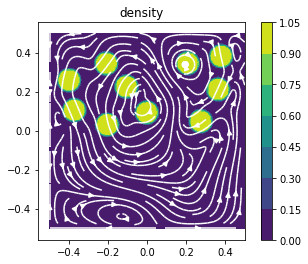

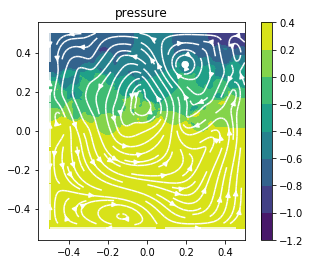

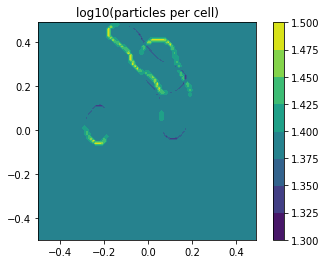

step number  1
solver time: 1.2673091888427734
(101, 101)
-0.33424924975143705


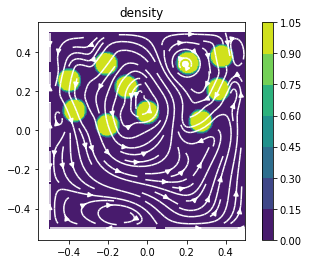

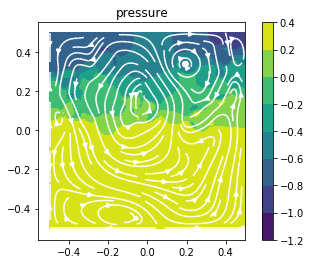

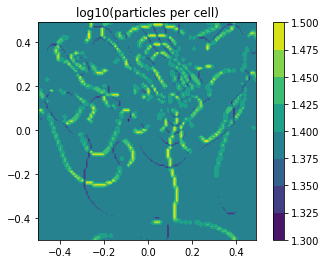

step number  2
solver time: 1.2752134799957275
(101, 101)
-0.3358306869520922


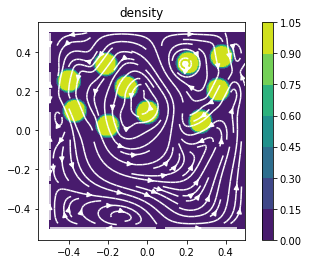

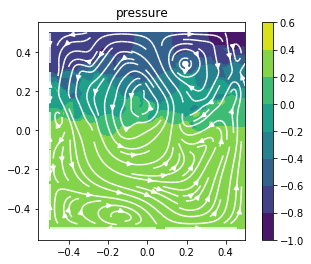

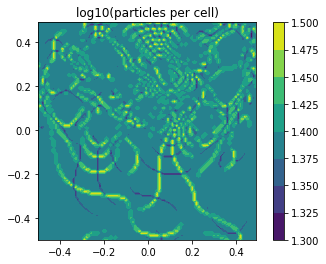

step number  3
solver time: 1.3042256832122803
(101, 101)
-0.33771959228288173


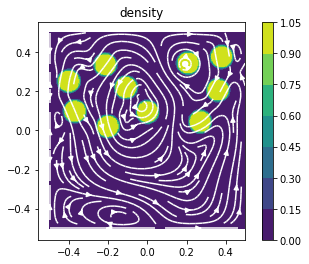

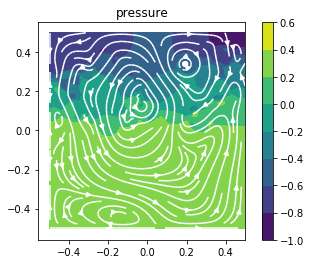

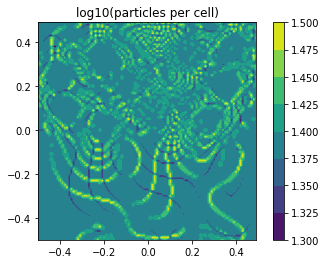

step number  4
solver time: 1.2807323932647705
(101, 101)
-0.33989286182881945


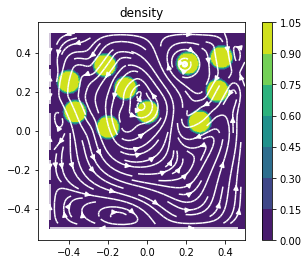

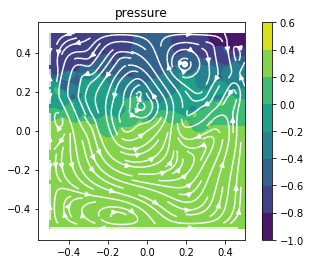

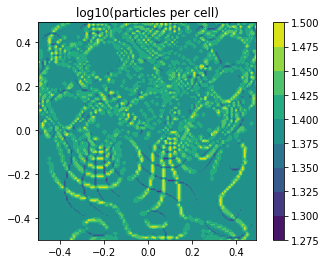

step number  5
solver time: 1.2892425060272217
(101, 101)
-0.34254158356240905


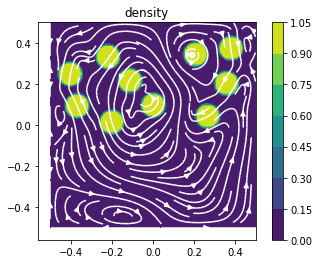

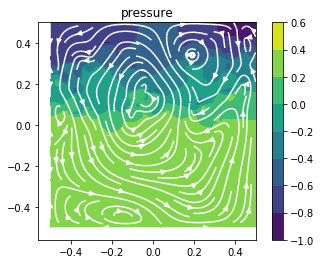

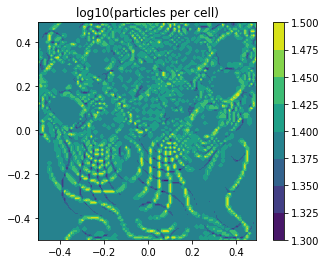

step number  6
solver time: 1.2842004299163818
(101, 101)
-0.34497165995438767


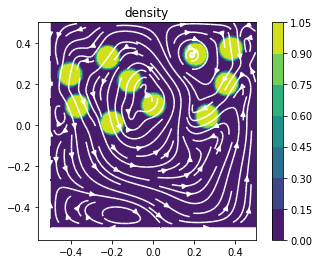

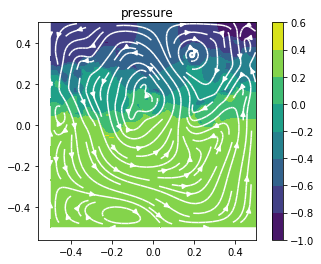

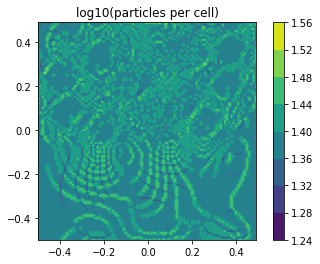

step number  7
solver time: 1.2736032009124756
(101, 101)
-0.34702357551595214


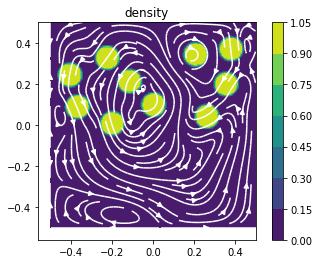

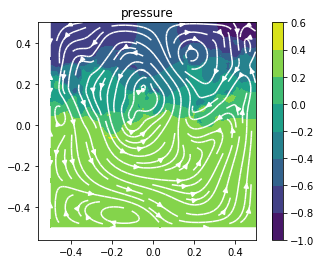

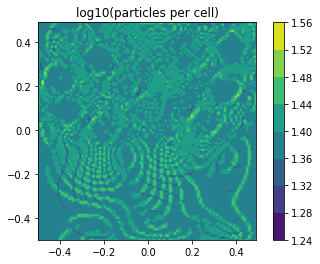

step number  8
solver time: 1.2765259742736816
(101, 101)
-0.3490634023391708


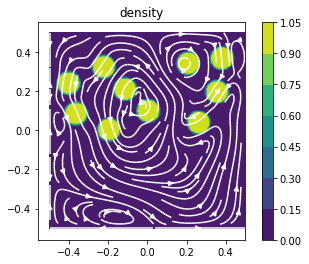

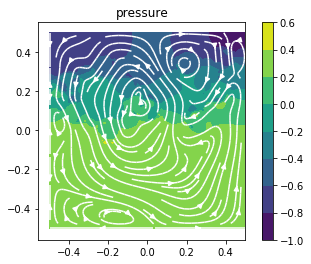

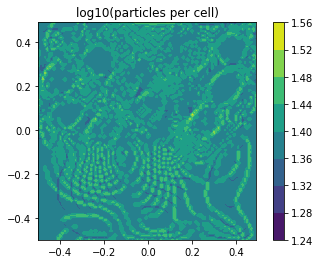

step number  9
solver time: 1.2756197452545166
(101, 101)
-0.3512358892377842


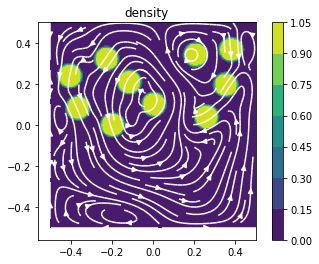

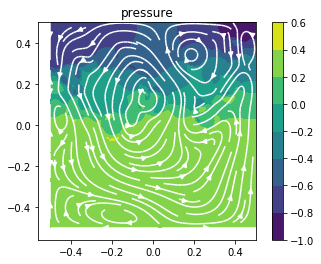

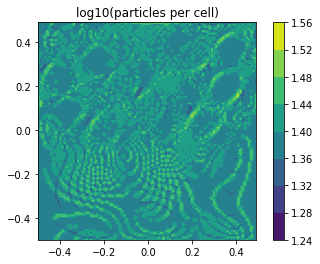

step number  10
solver time: 1.2988612651824951
(101, 101)
-0.35330960433670583


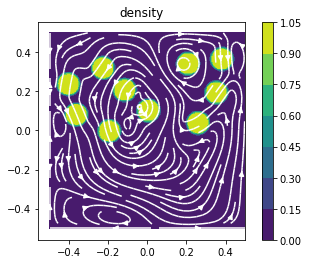

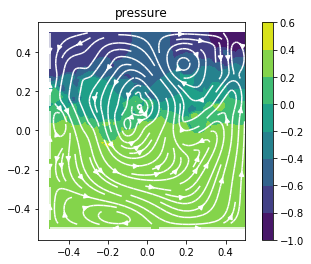

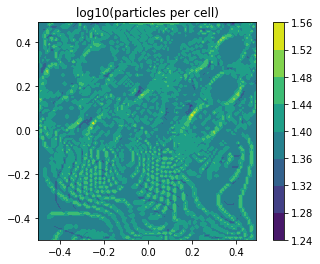

step number  11
solver time: 1.2793517112731934
(101, 101)
-0.3547613529293941


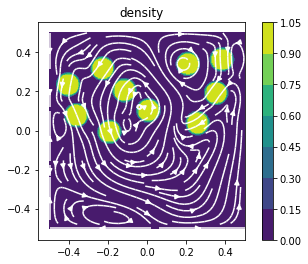

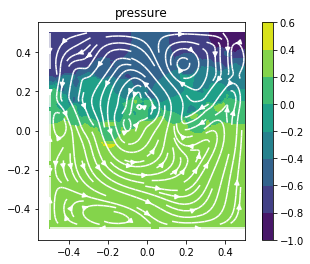

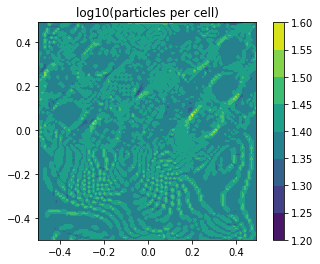

step number  12
solver time: 1.3003575801849365
(101, 101)
-0.356563127836807


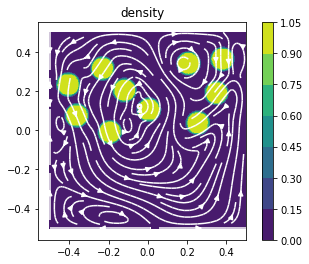

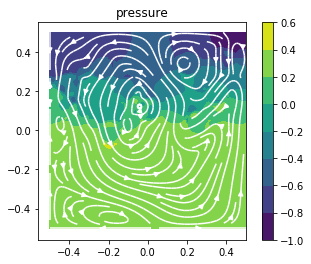

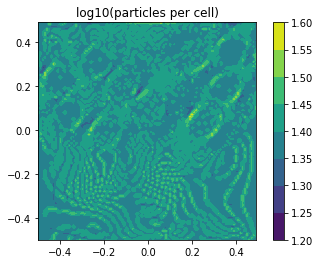

step number  13
solver time: 1.2727046012878418
(101, 101)
-0.35915175035869157


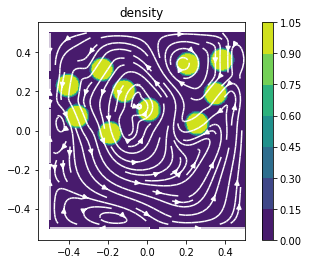

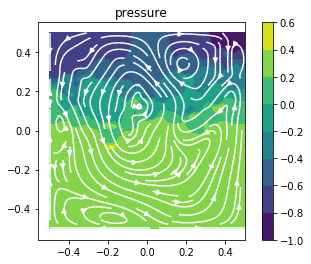

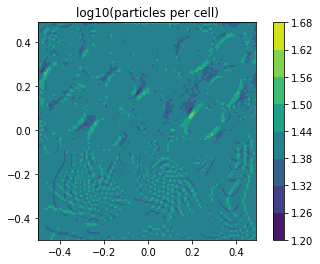

step number  14
solver time: 1.2751569747924805
(101, 101)
-0.3612429764815544


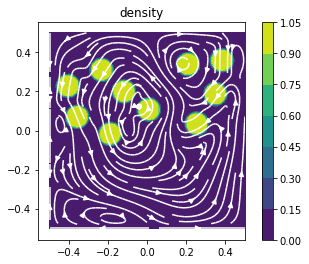

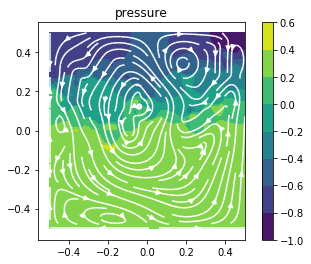

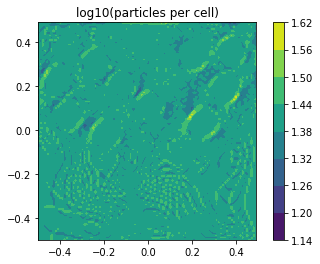

step number  15
solver time: 1.289395809173584
(101, 101)
-0.3636573882465805


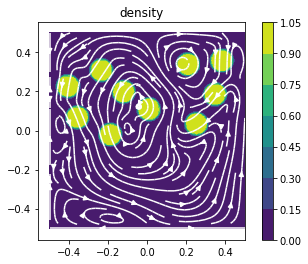

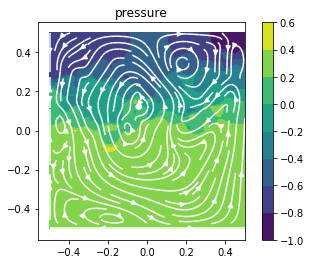

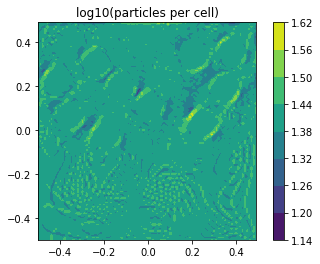

step number  16
solver time: 1.2869658470153809
(101, 101)
-0.3658904879996138


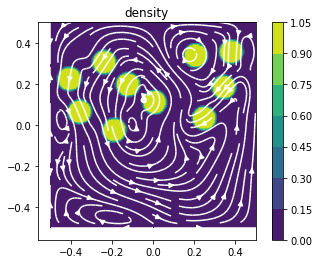

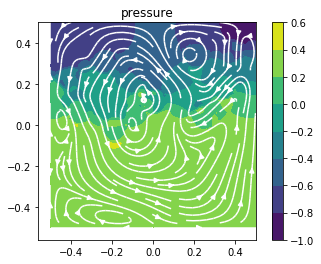

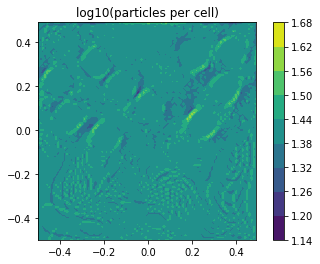

step number  17
solver time: 1.259387493133545
(101, 101)
-0.3683117264073598


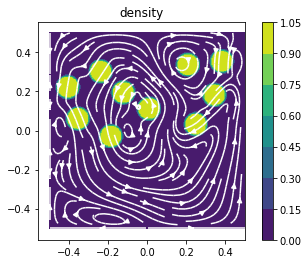

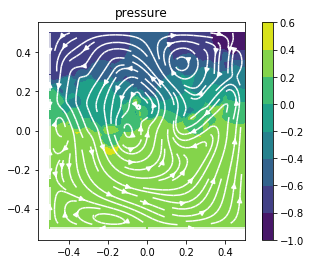

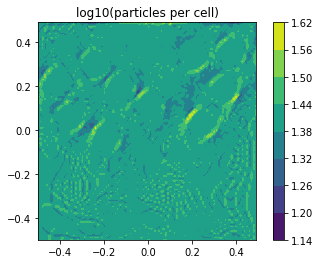

step number  18
solver time: 1.271538257598877
(101, 101)
-0.3707763327876819


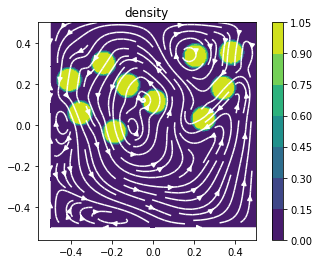

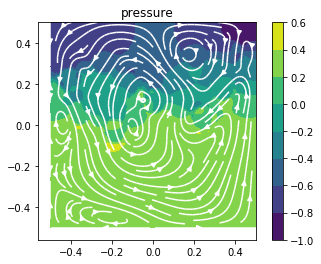

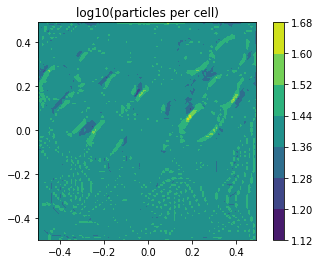

step number  19
solver time: 1.2485864162445068
(101, 101)
-0.37256959194795086


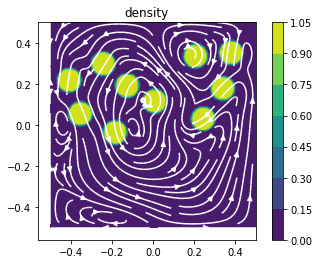

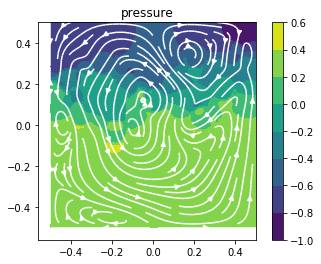

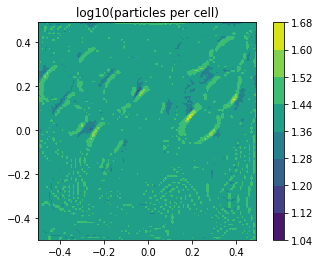

step number  20
solver time: 1.2483751773834229
(101, 101)
-0.375196015456162


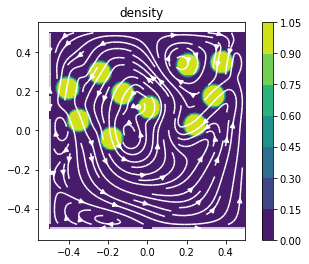

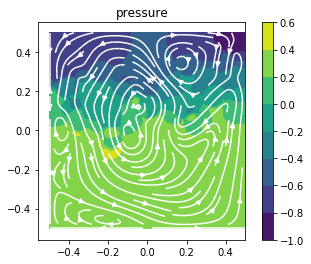

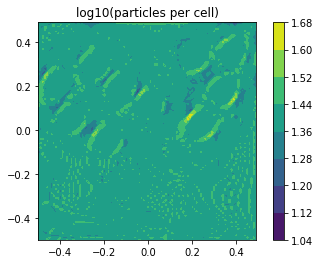

step number  21
solver time: 1.2756521701812744
(101, 101)
-0.3775449829045703


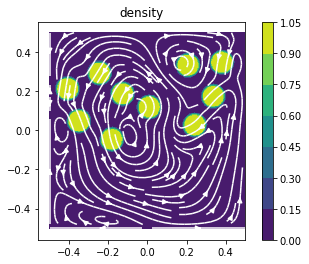

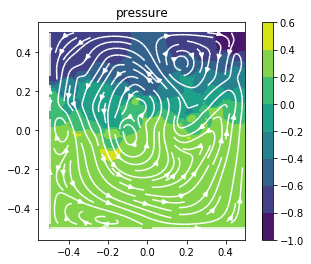

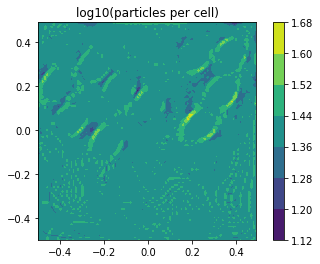

step number  22
solver time: 1.2585818767547607
(101, 101)
-0.38051499128068983


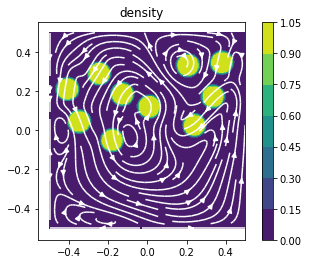

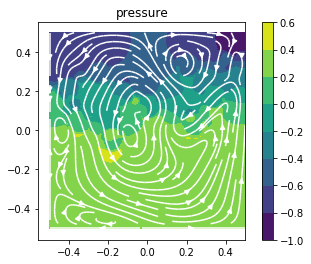

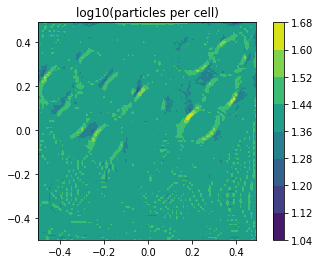

step number  23
solver time: 1.2497644424438477
(101, 101)
-0.3835907140345201


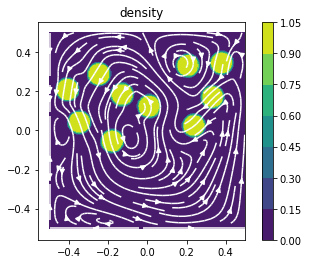

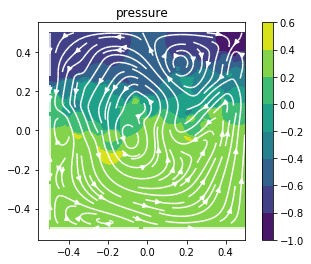

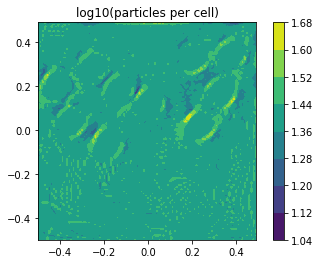

step number  24
solver time: 1.2532916069030762
(101, 101)
-0.3863324107184736


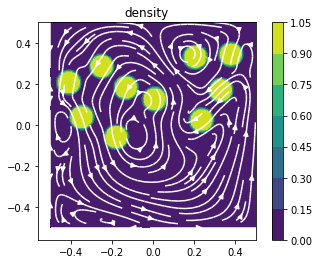

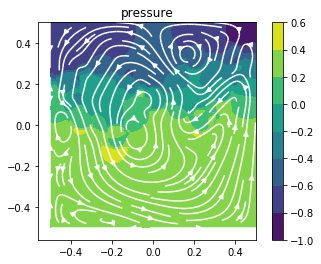

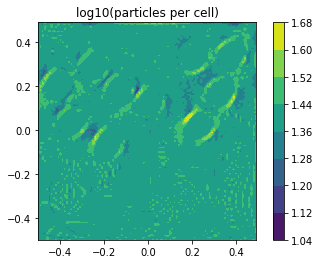

step number  25
solver time: 1.2533130645751953
(101, 101)
-0.38935137147841703


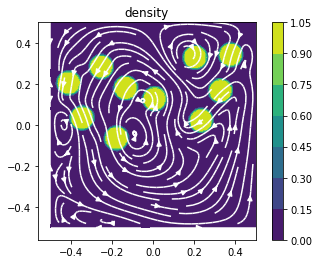

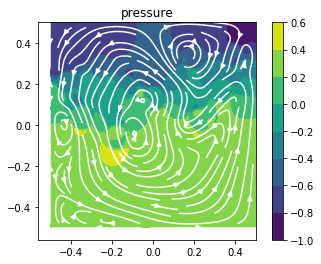

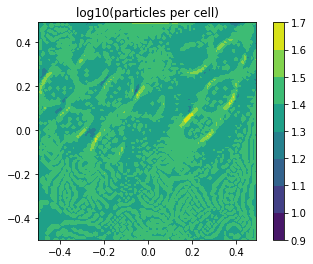

step number  26
solver time: 1.2616209983825684
(101, 101)
-0.39250639707275764


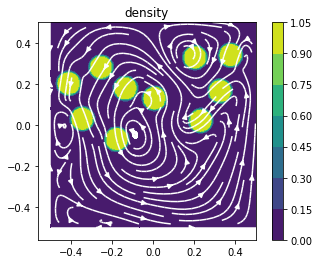

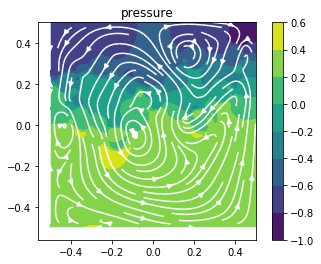

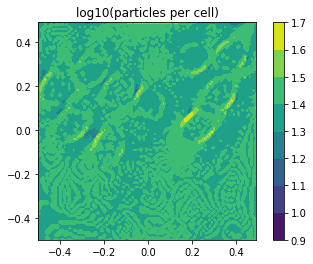

step number  27
solver time: 1.2572927474975586
(101, 101)
-0.39566810418655474


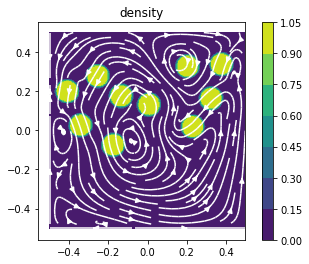

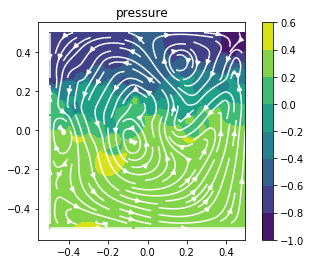

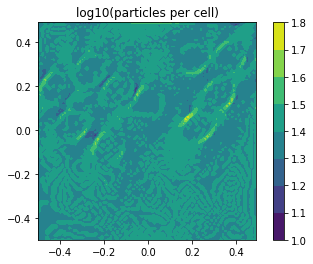

step number  28
solver time: 1.2668490409851074
(101, 101)
-0.39942108144948074


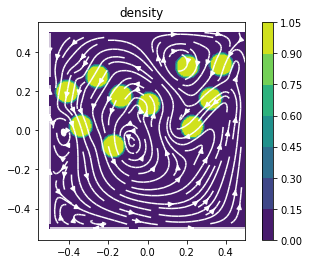

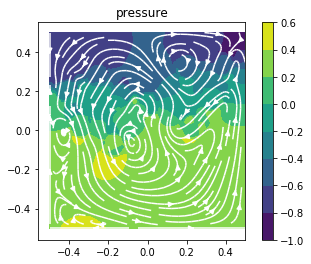

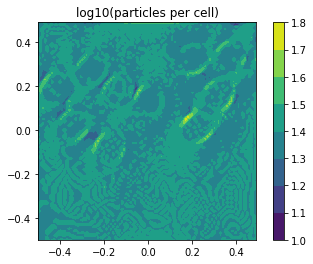

step number  29
solver time: 1.264662742614746
(101, 101)
-0.40295314242511865


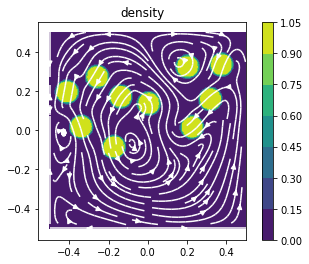

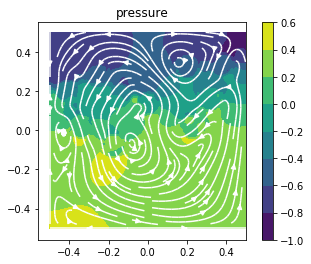

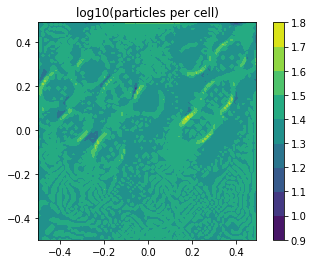

step number  30
solver time: 1.2634038925170898
(101, 101)
-0.40611054205400243


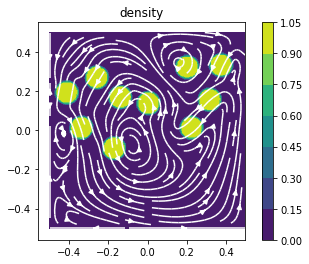

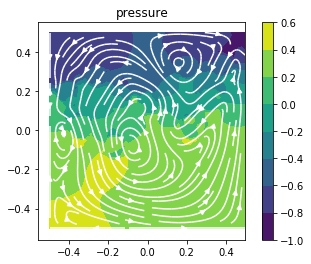

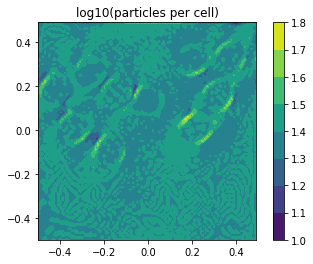

step number  31
solver time: 1.2575571537017822
(101, 101)
-0.4097981214379622


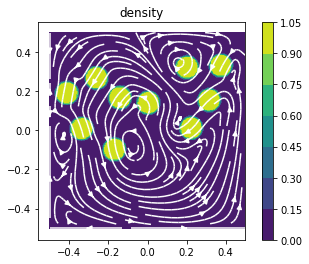

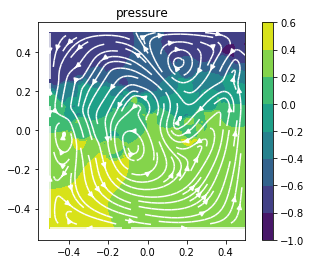

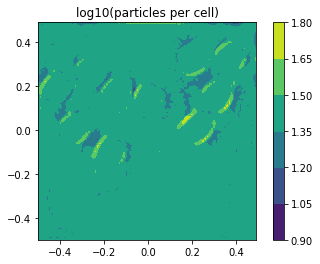

step number  32
solver time: 1.2738370895385742
(101, 101)
-0.4138318728784963


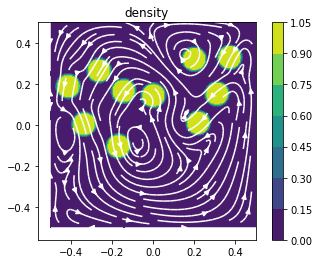

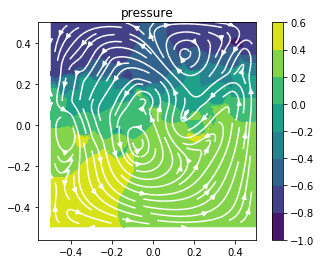

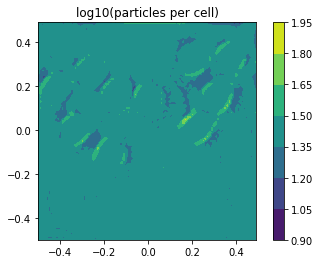

step number  33
solver time: 1.2722179889678955
(101, 101)
-0.4183288767776657


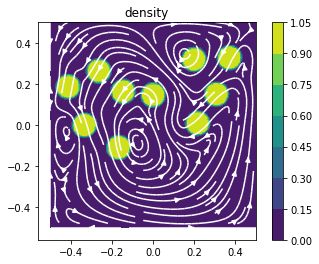

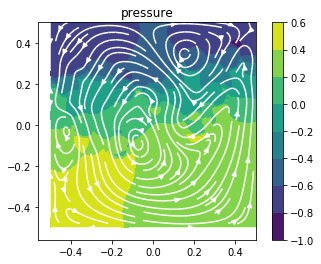

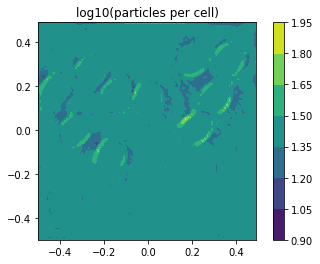

step number  34
solver time: 1.2737958431243896
(101, 101)
-0.42209181893529424


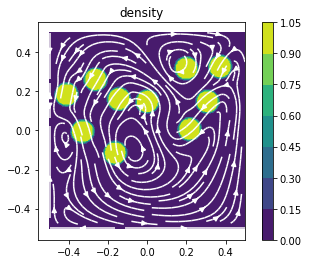

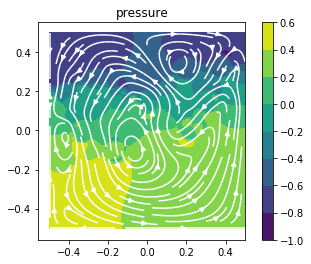

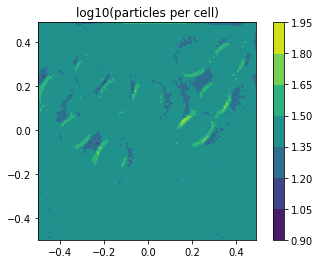

step number  35
solver time: 1.254347324371338
(101, 101)
-0.4256489073317958


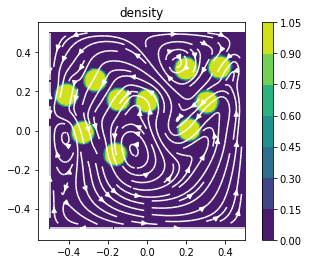

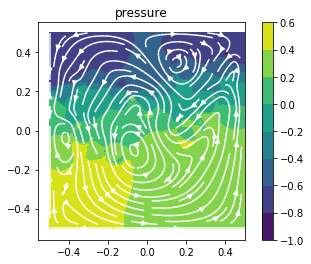

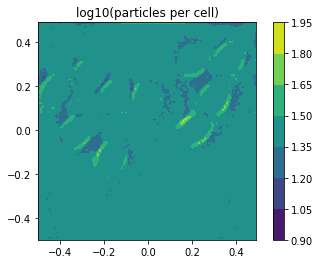

step number  36
solver time: 1.2612786293029785
(101, 101)
-0.4290128281486261


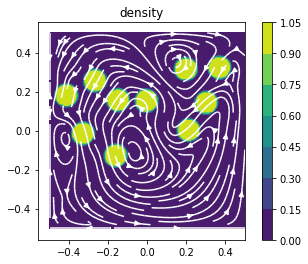

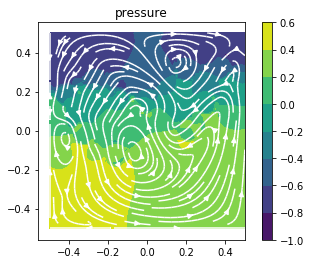

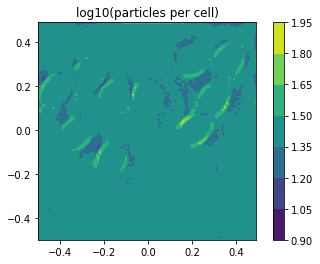

step number  37
solver time: 1.2558538913726807
(101, 101)
-0.43331568355293365


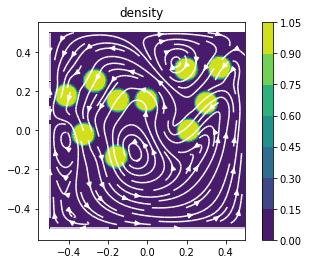

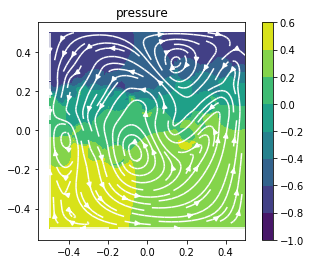

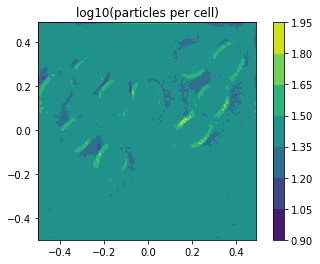

step number  38
solver time: 1.2763588428497314
(101, 101)
-0.43707113860937996


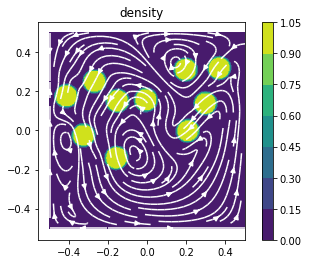

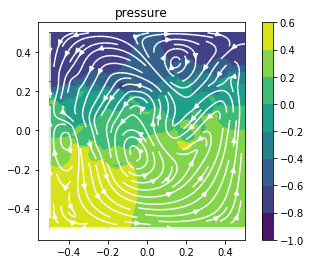

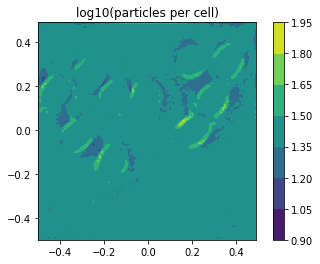

step number  39
solver time: 1.2674574851989746
(101, 101)
-0.4413079060641978


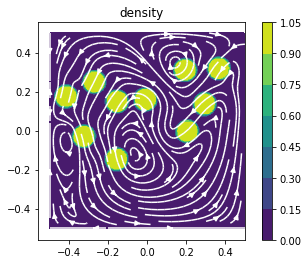

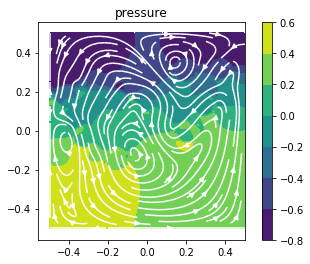

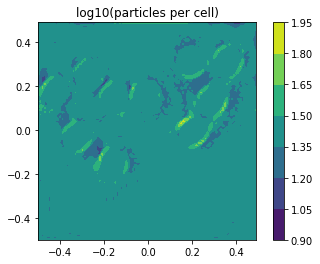

step number  40
solver time: 1.2557203769683838
(101, 101)
-0.4453438154734954


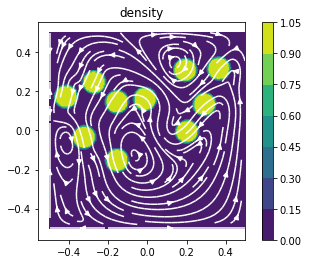

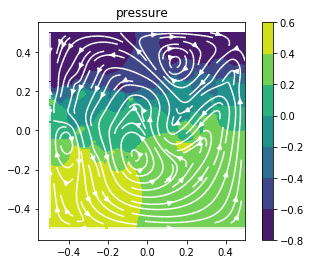

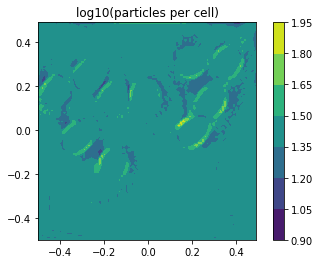

step number  41
solver time: 1.2709333896636963
(101, 101)
-0.44818942933770034


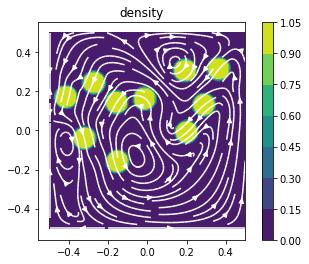

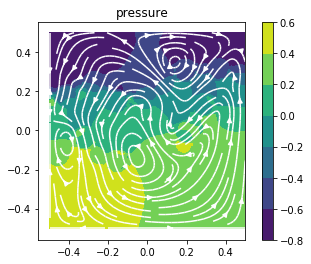

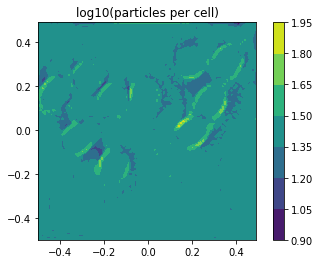

step number  42
solver time: 1.261134386062622
(101, 101)
-0.4522386352058868


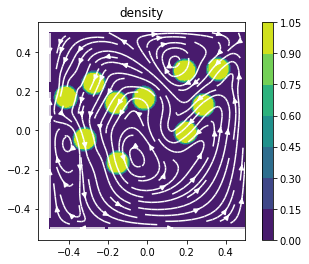

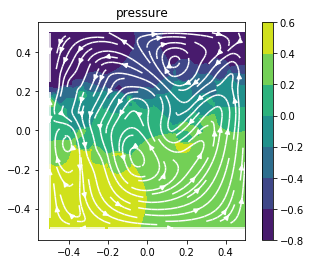

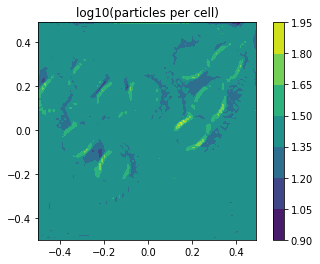

step number  43
solver time: 1.260392427444458
(101, 101)
-0.4571965223583349


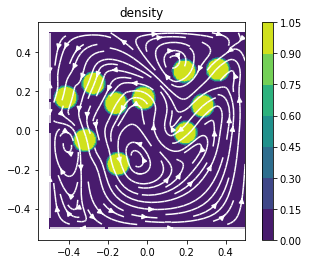

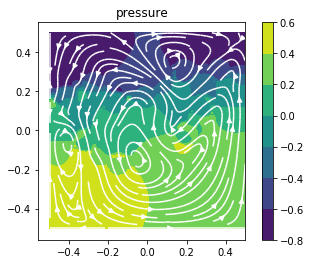

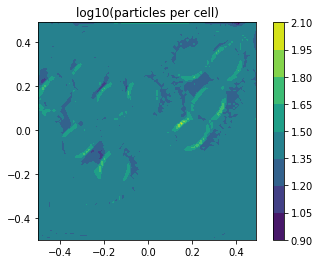

step number  44
solver time: 1.2671802043914795
(101, 101)
-0.46180580736506954


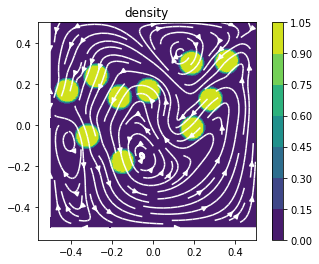

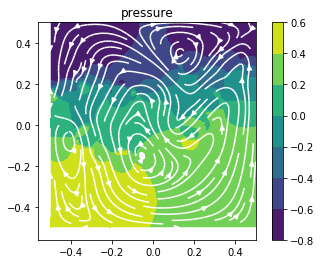

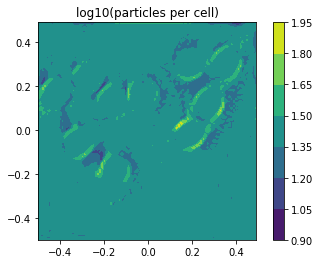

step number  45
solver time: 1.257507085800171
(101, 101)
-0.4661350125021043


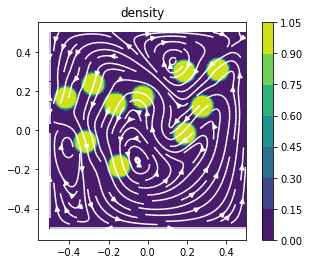

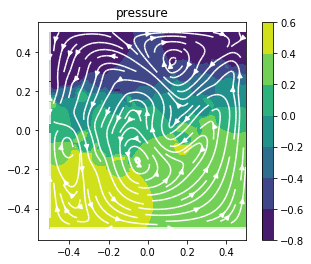

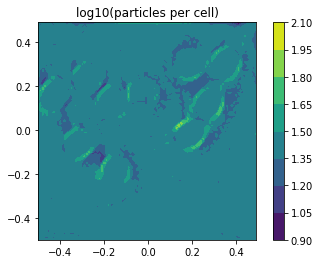

step number  46
solver time: 1.2648465633392334
(101, 101)
-0.46949022130213625


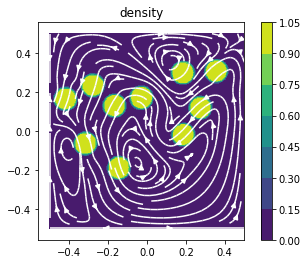

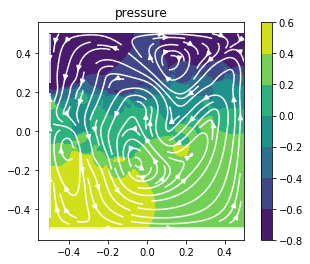

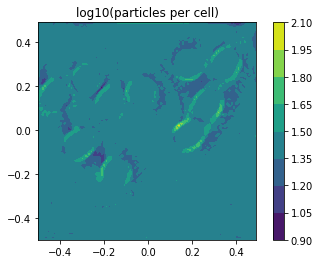

step number  47
solver time: 1.2558777332305908
(101, 101)
-0.47346126381517034


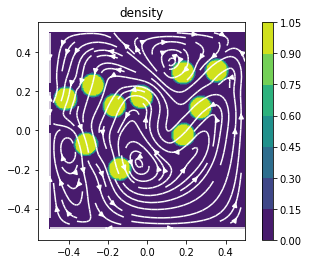

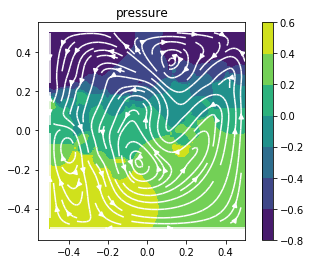

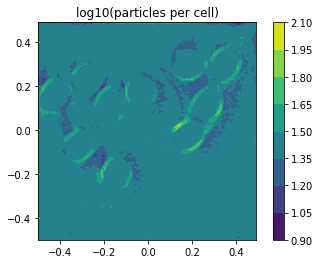

step number  48
solver time: 1.259002685546875
(101, 101)
-0.47815892891518547


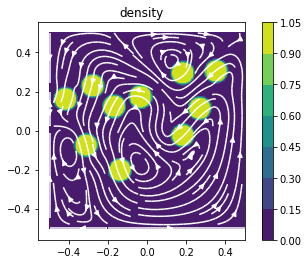

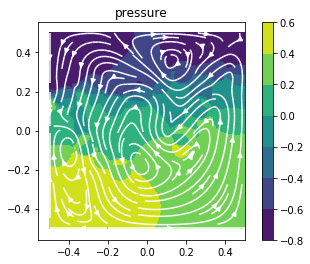

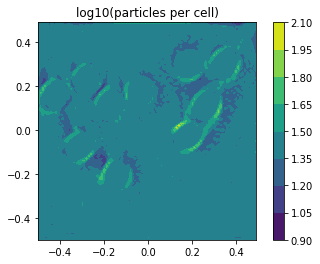

step number  49
solver time: 1.248621940612793
(101, 101)
-0.4822359442318323


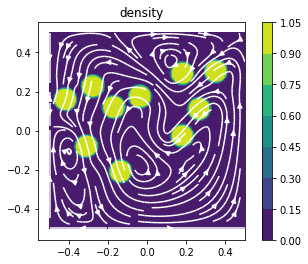

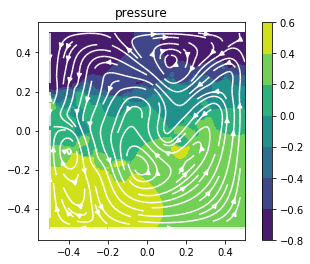

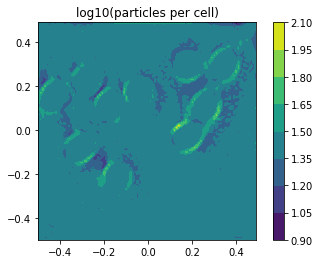

step number  50
solver time: 1.261209487915039
(101, 101)
-0.4863889288530576


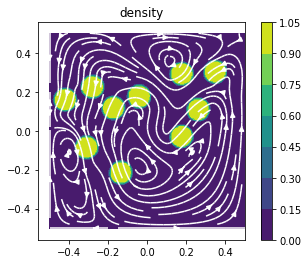

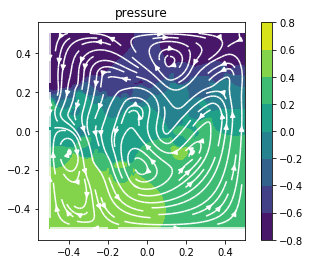

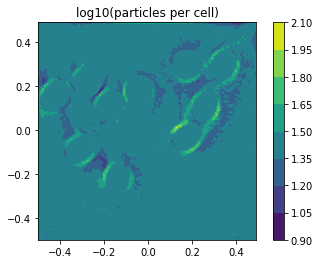

step number  51
solver time: 1.2878715991973877
(101, 101)
-0.49043473627428097


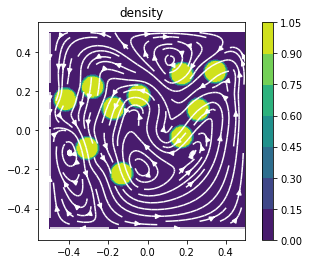

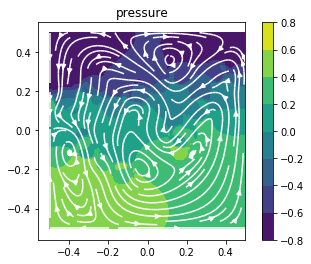

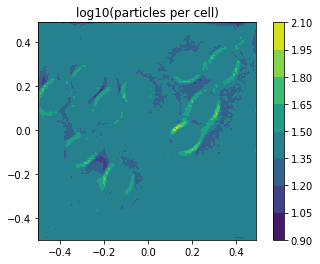

step number  52
solver time: 1.2626526355743408
(101, 101)
-0.49447532289827484


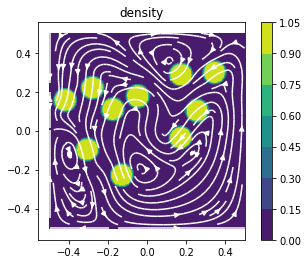

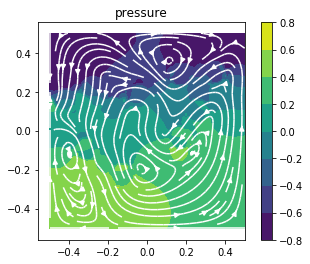

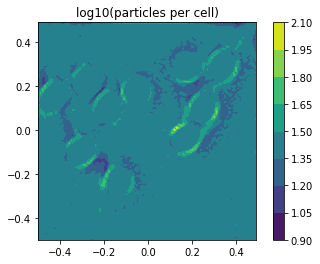

step number  53
solver time: 1.2402658462524414
(101, 101)
-0.499018826668618


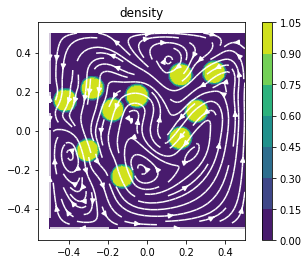

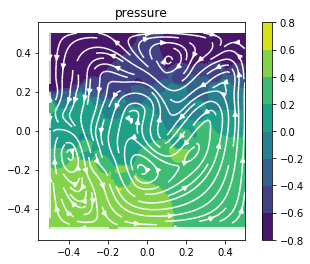

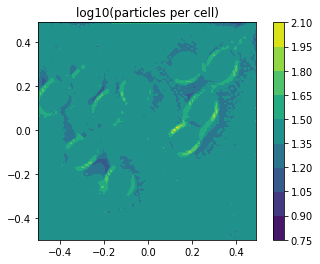

step number  54
solver time: 1.2476015090942383
(101, 101)
-0.5011860682480066


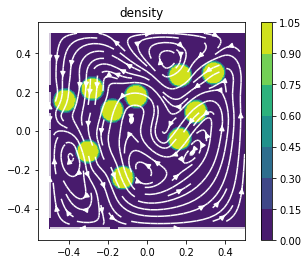

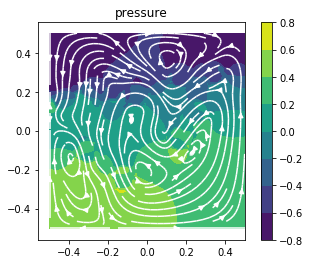

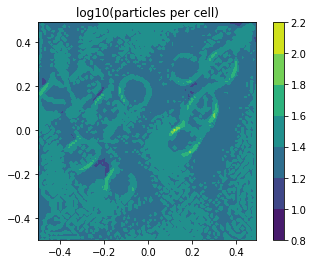

step number  55
solver time: 1.256988763809204
(101, 101)
-0.504673118620816


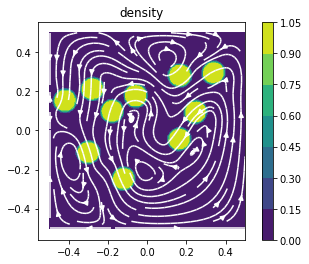

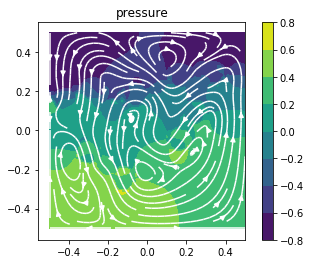

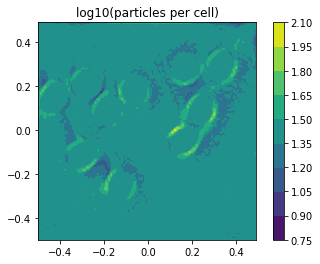

step number  56
solver time: 1.2622430324554443
(101, 101)
-0.509036629615941


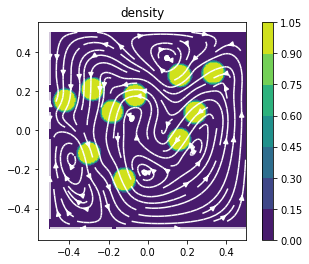

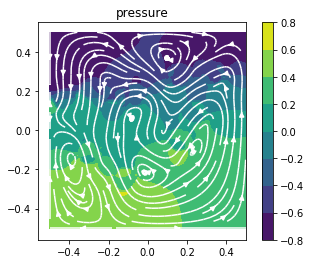

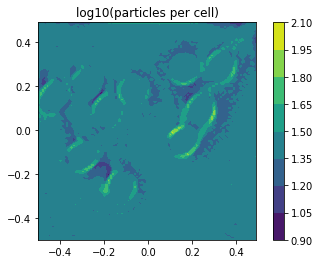

step number  57
solver time: 1.2971904277801514
(101, 101)
-0.5108911403740212


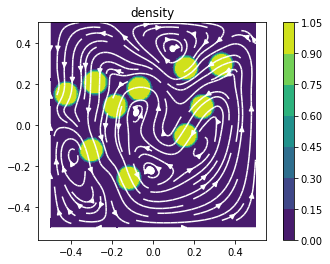

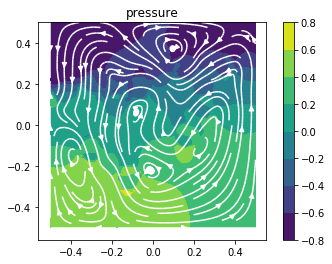

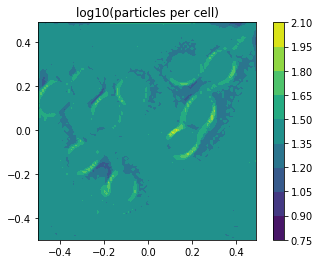

step number  58
solver time: 1.260389804840088
(101, 101)
-0.51338369070731


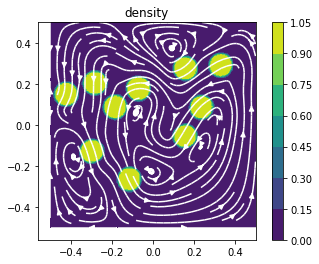

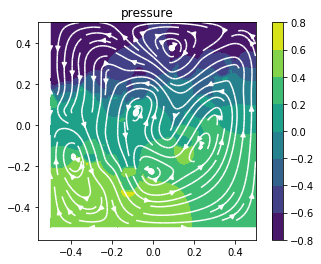

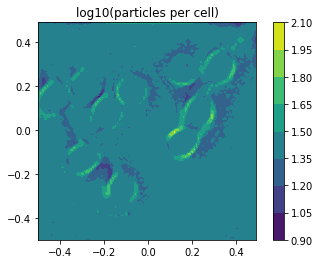

step number  59
solver time: 1.2748100757598877
(101, 101)
-0.5162264670332646


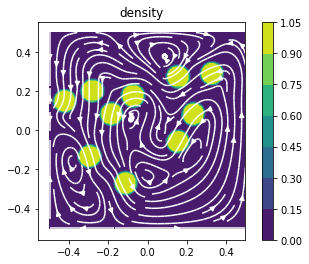

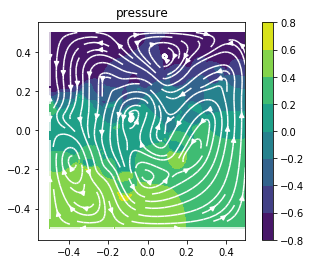

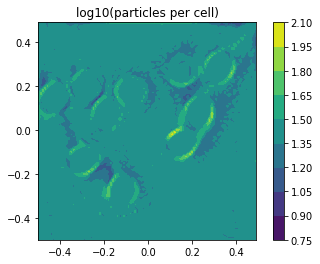

step number  60
solver time: 1.2588586807250977
(101, 101)
-0.5183374270527938


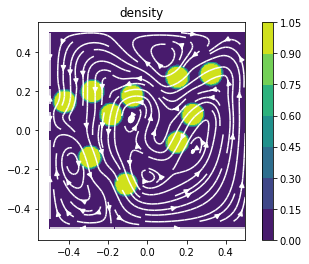

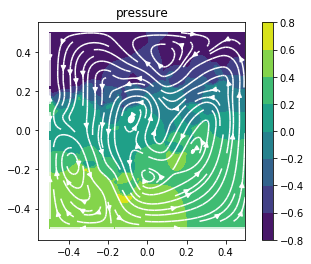

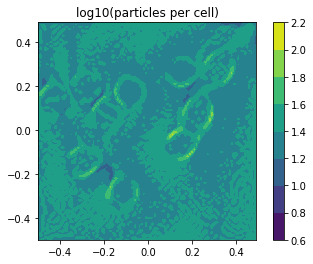

step number  61
solver time: 1.2590546607971191
(101, 101)
-0.5199622851960086


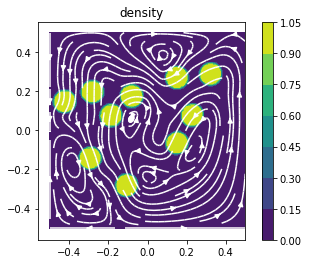

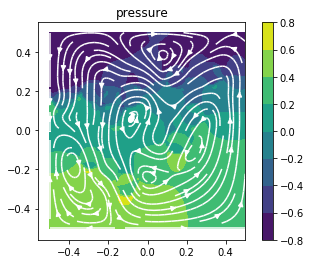

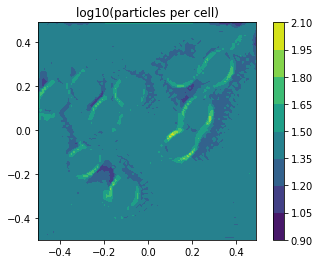

step number  62
solver time: 1.2617790699005127
(101, 101)
-0.5214578570379903


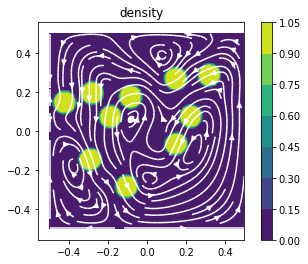

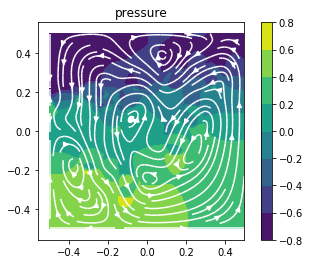

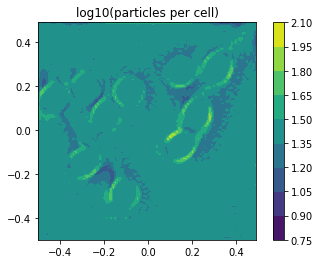

step number  63
solver time: 1.2692272663116455
(101, 101)
-0.522910079469756


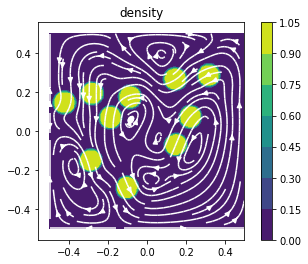

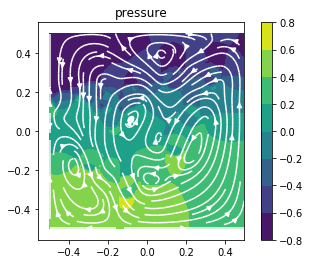

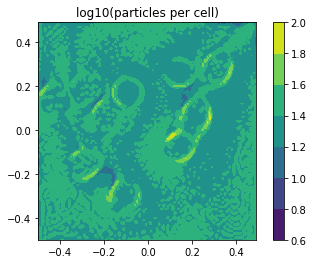

step number  64
solver time: 1.2612135410308838
(101, 101)
-0.5236852771550389


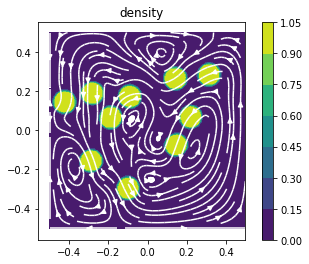

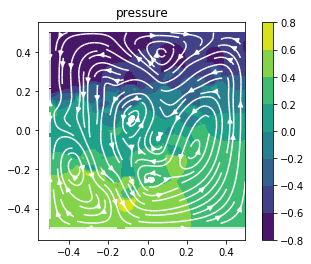

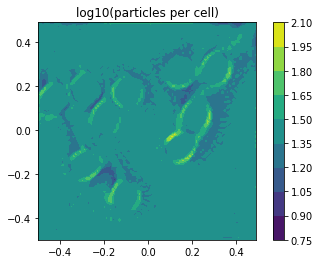

step number  65
solver time: 1.2709705829620361
(101, 101)
-0.5257834631663239


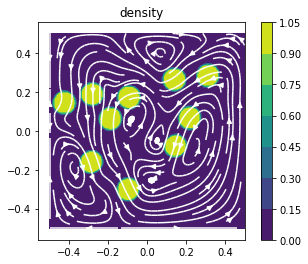

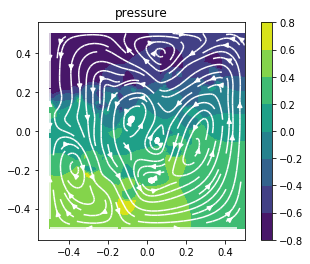

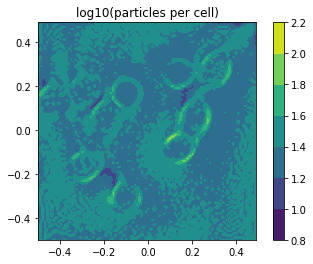

step number  66
solver time: 1.2789080142974854
(101, 101)
-0.5262204154489416


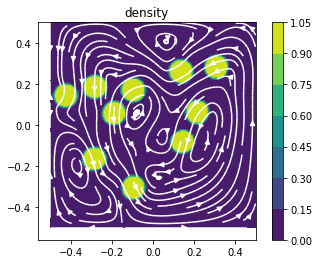

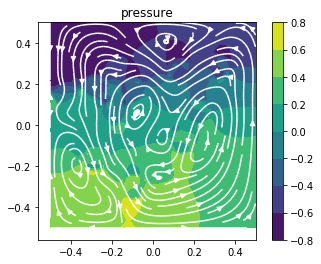

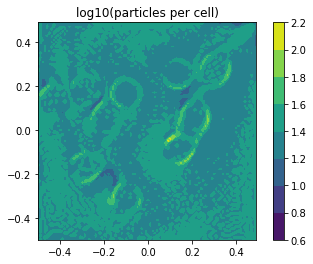

step number  67
solver time: 1.258422613143921
(101, 101)
-0.5267451359008134


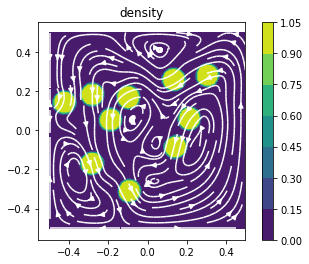

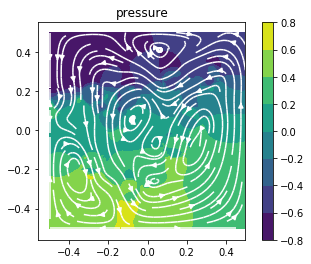

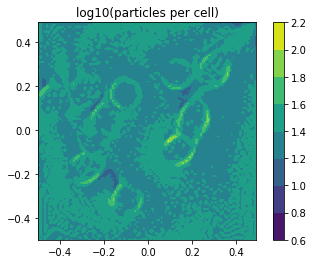

step number  68
solver time: 1.2974720001220703
(101, 101)
-0.5282574438900313


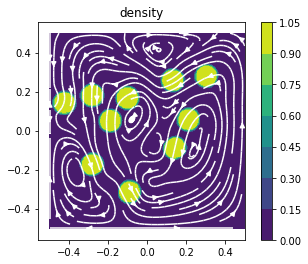

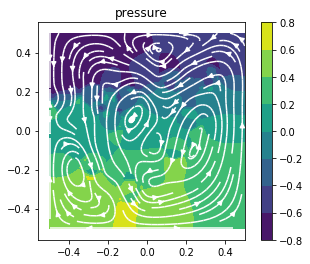

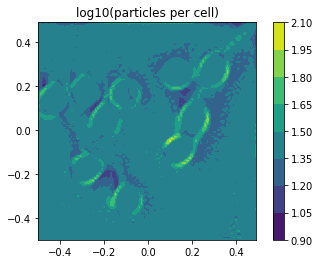

step number  69
solver time: 1.2681694030761719
(101, 101)
-0.5292349485462678


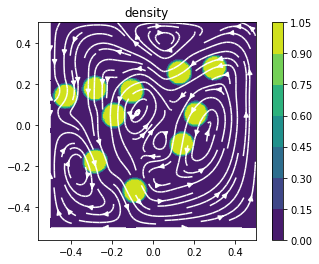

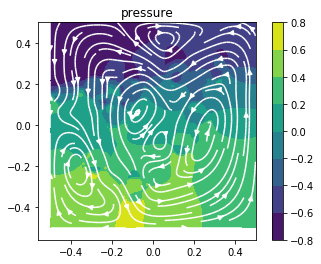

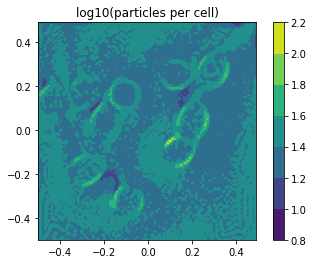

step number  70
solver time: 1.2600510120391846
(101, 101)
-0.5301109691318001


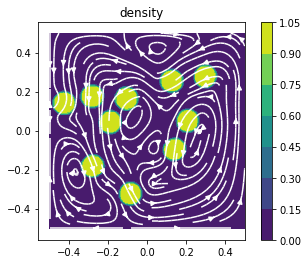

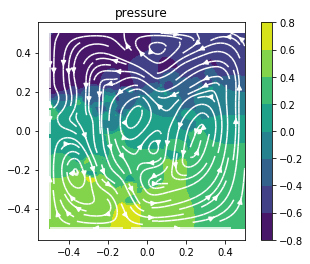

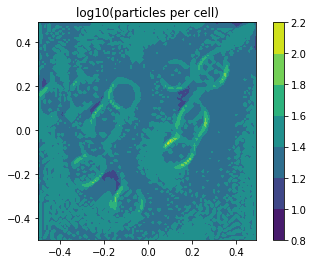

step number  71
solver time: 1.2671823501586914
(101, 101)
-0.5306007762200842


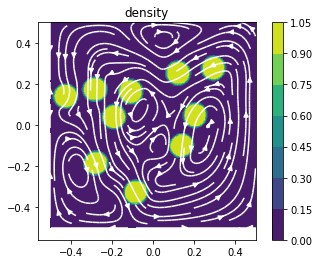

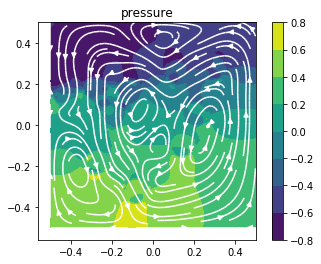

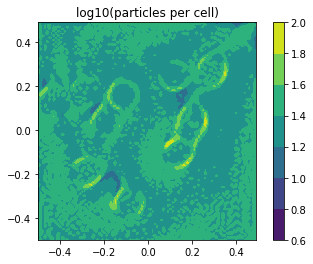

step number  72
solver time: 1.2688095569610596
(101, 101)
-0.5317873747279659


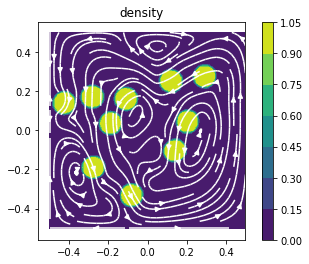

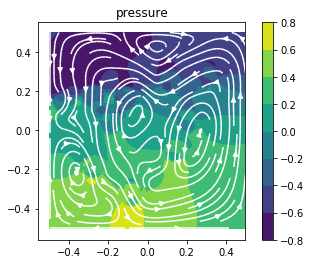

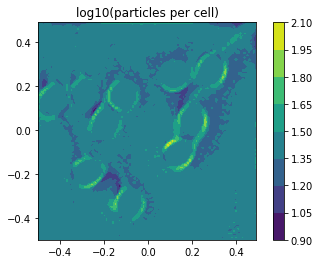

step number  73
solver time: 1.276174545288086
(101, 101)
-0.5326335724862602


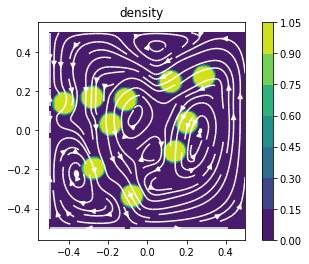

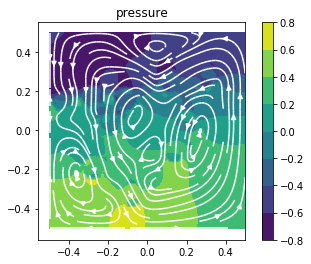

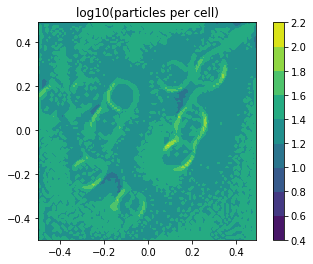

step number  74
solver time: 1.2699086666107178
(101, 101)
-0.5325388615250289


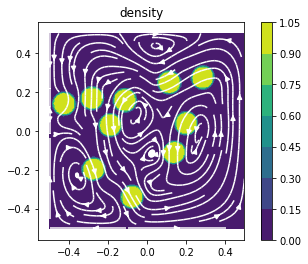

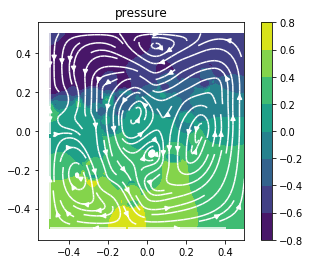

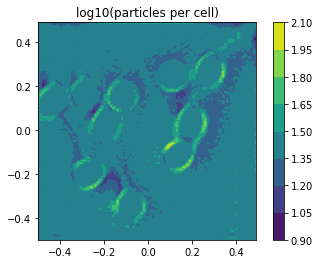

step number  75
solver time: 1.2808289527893066
(101, 101)
-0.5328318020135493


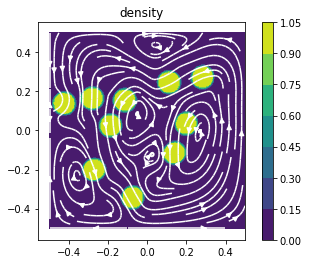

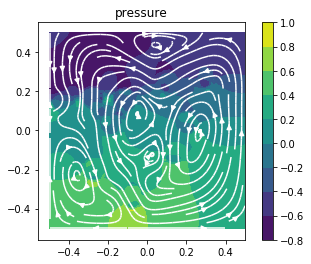

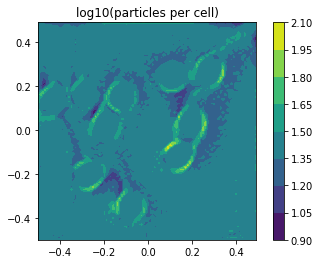

step number  76
solver time: 1.2596232891082764
(101, 101)
-0.5336764281522413


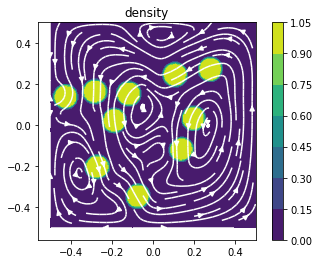

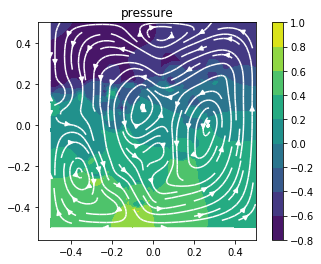

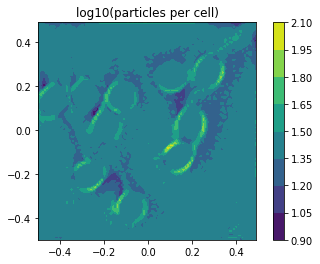

step number  77
solver time: 1.2700438499450684
(101, 101)
-0.534893413556455


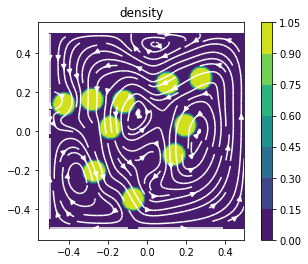

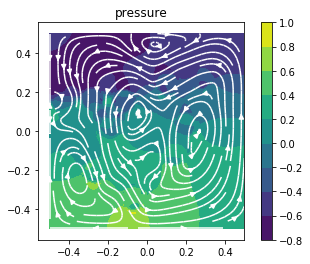

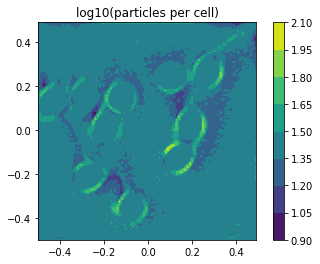

step number  78
solver time: 1.2629010677337646
(101, 101)
-0.536252478156006


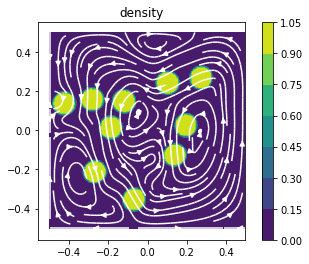

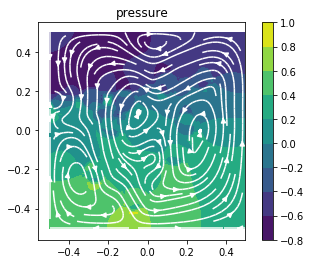

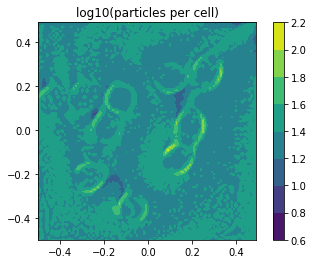

step number  79
solver time: 1.2739131450653076
(101, 101)
-0.5371445908079809


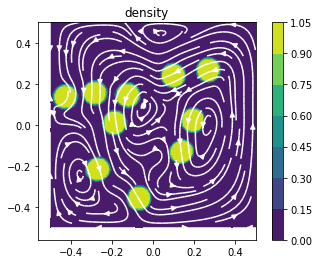

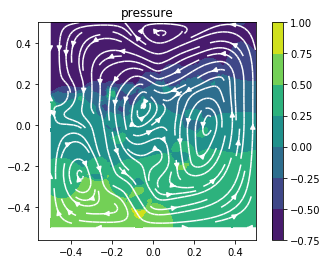

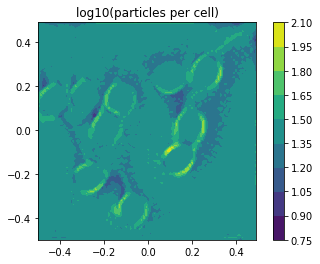

step number  80
solver time: 1.2777092456817627
(101, 101)
-0.5379278148121839


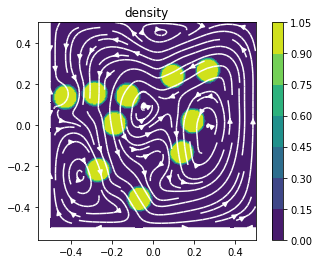

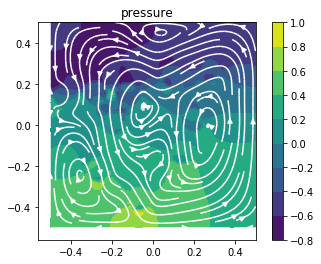

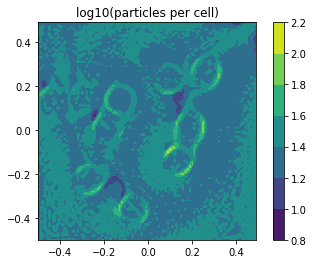

step number  81
solver time: 1.2518954277038574
(101, 101)
-0.5378502852334069


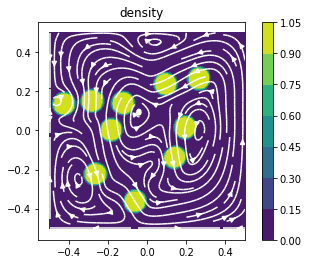

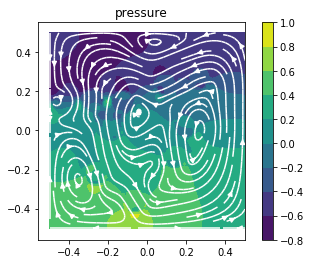

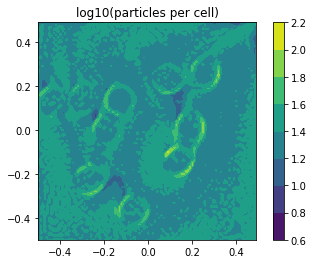

step number  82
solver time: 1.2976329326629639
(101, 101)
-0.5382843106039442


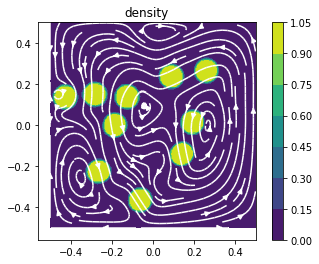

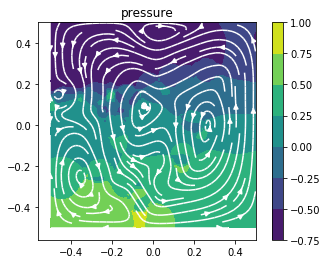

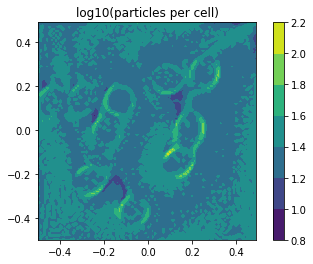

step number  83
solver time: 1.269742488861084
(101, 101)
-0.5386093522436188


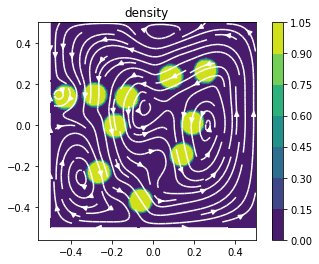

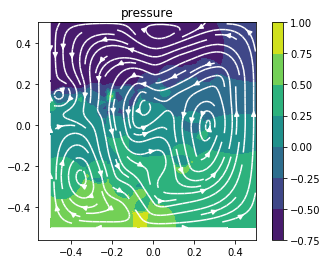

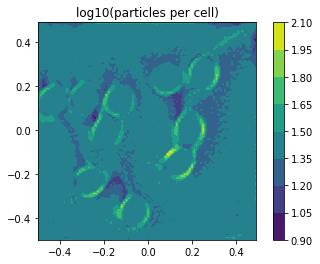

step number  84
solver time: 1.2601511478424072
(101, 101)
-0.5398989813101969


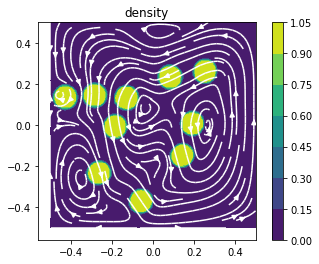

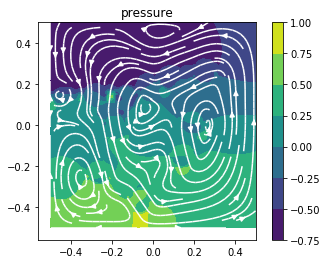

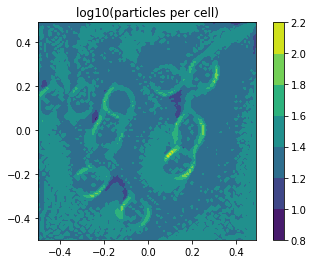

step number  85
solver time: 1.2873783111572266
(101, 101)
-0.5406401846792945


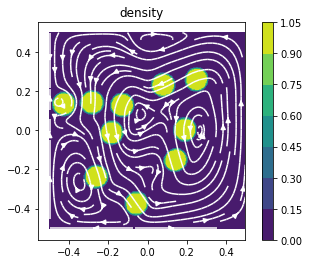

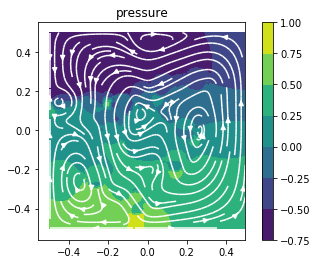

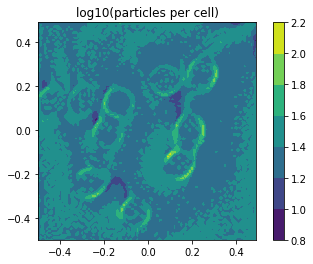

step number  86
solver time: 1.2579419612884521
(101, 101)
-0.5416763092663358


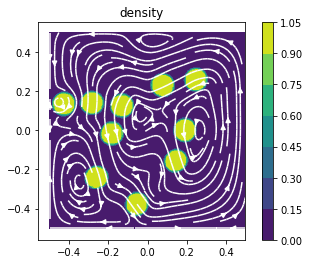

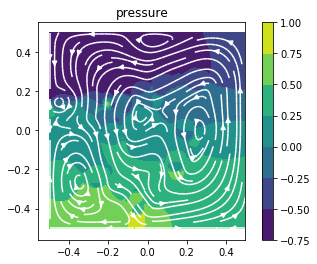

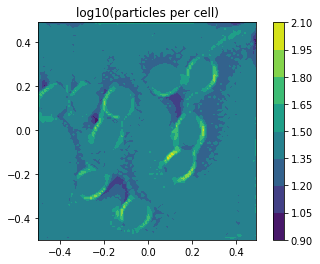

step number  87
solver time: 1.2540464401245117
(101, 101)
-0.5423845389741971


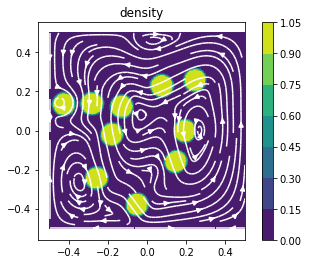

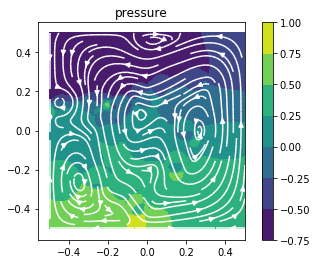

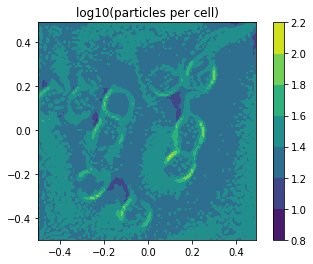

step number  88
solver time: 1.2610559463500977
(101, 101)
-0.5435246318770828


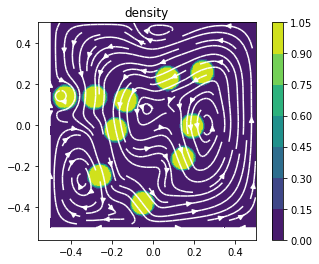

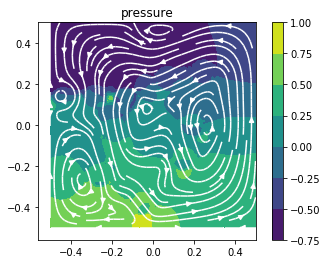

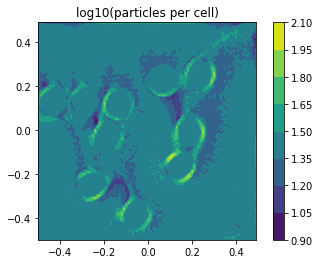

step number  89
solver time: 1.295060634613037
(101, 101)
-0.5457995482283212


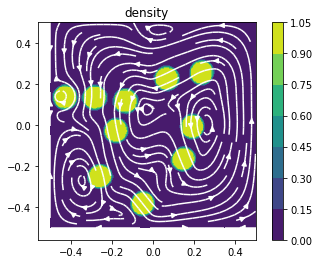

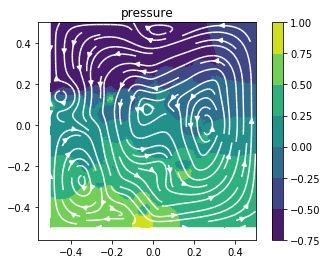

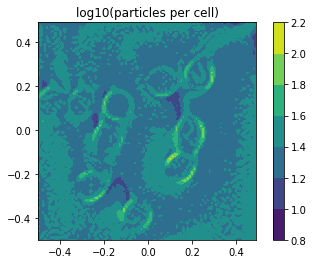

step number  90
solver time: 1.2601397037506104
(101, 101)
-0.5461962938731942


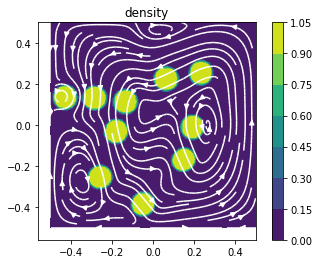

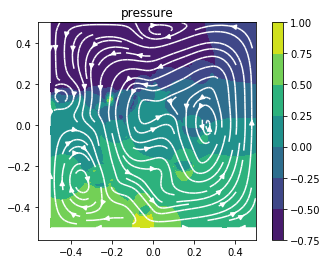

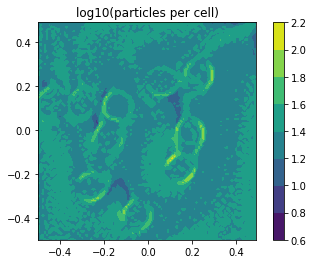

step number  91
solver time: 1.2756261825561523
(101, 101)
-0.5473630021728264


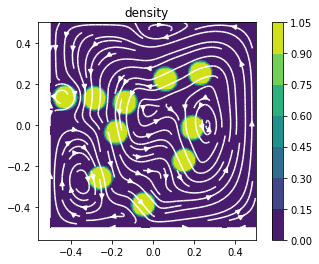

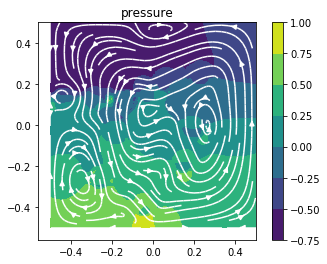

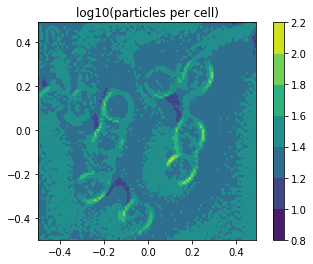

step number  92
solver time: 1.264838695526123
(101, 101)
-0.5487398529271755


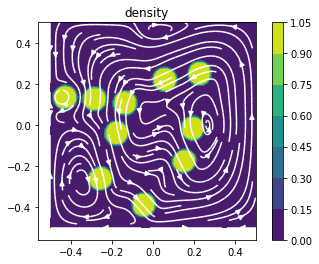

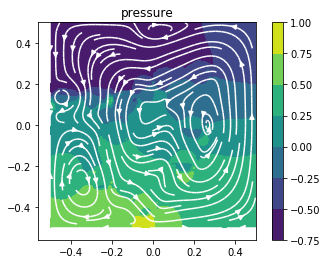

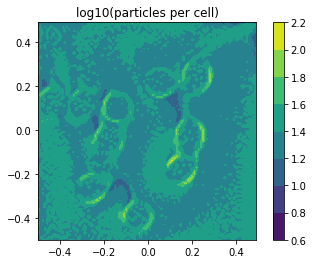

step number  93
solver time: 1.2692310810089111
(101, 101)
-0.5482697530155495


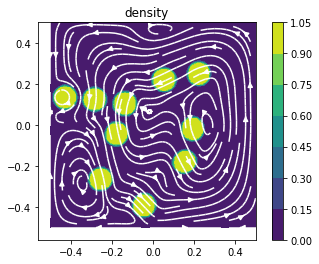

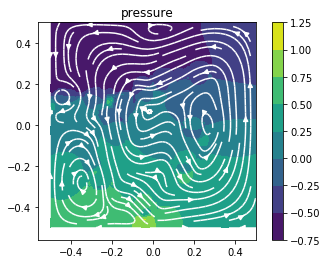

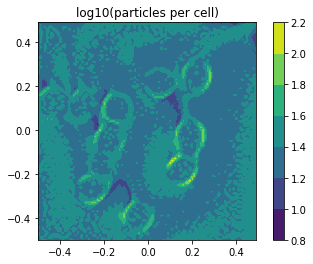

step number  94
solver time: 1.288893222808838
(101, 101)
-0.5482067431896201


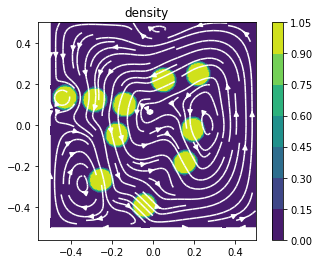

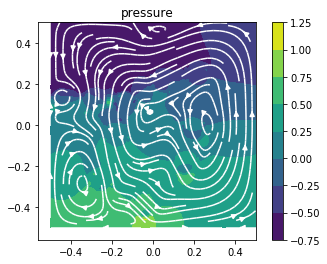

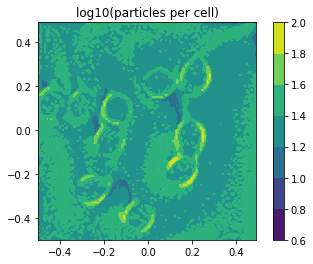

step number  95
solver time: 1.2503163814544678
(101, 101)
-0.5494620023934089


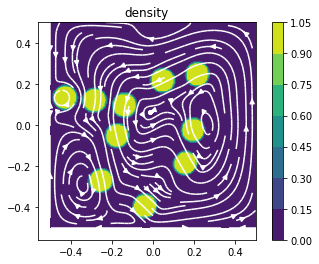

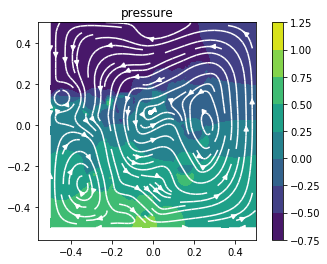

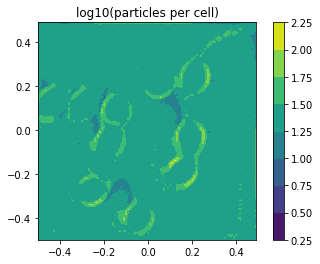

step number  96
solver time: 1.2666964530944824
(101, 101)
-0.5503679384791531


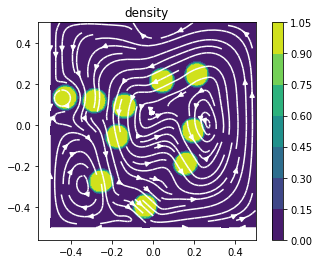

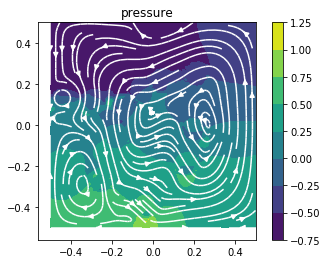

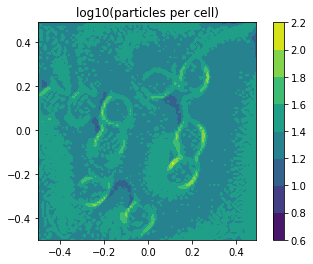

step number  97
solver time: 1.2731637954711914
(101, 101)
-0.5514540214375427


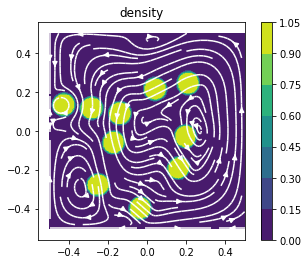

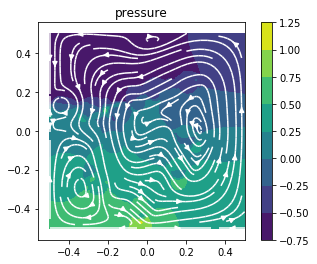

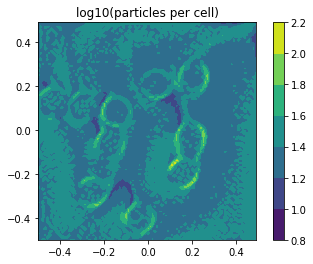

step number  98
solver time: 1.2697722911834717
(101, 101)
-0.552660888827359


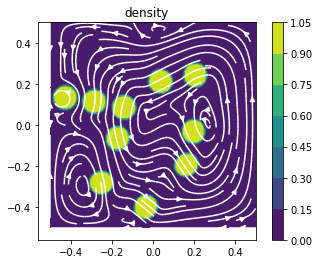

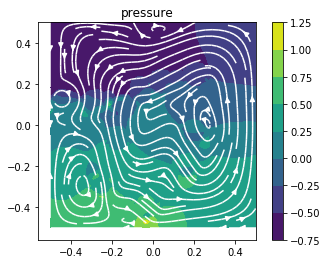

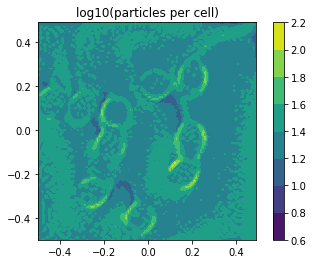

step number  99
solver time: 1.2673096656799316
(101, 101)
-0.5536719285807593


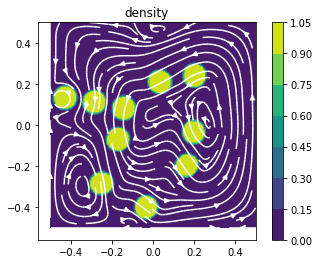

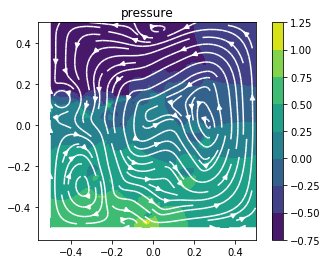

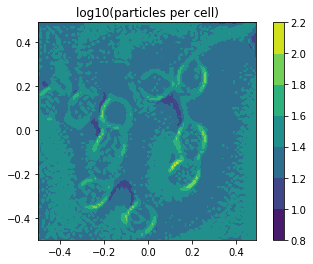

In [16]:
import time
import matplotlib.pyplot as plt
import numpy as np
import scipy.sparse as sparse
import scipy.sparse.linalg as la

nxp=101; nxc=nxp-1; nxpInt=nxc-1; xTot=1.0; dx=xTot/nxc; xMin=-xTot/2.0; xMax=xTot/2.0
nyp=101; nyc=nyp-1; nypInt=nyc-1; yTot=1.0; dy=yTot/nyc; yMin=-yTot/2.0; yMax=yTot/2.0
steps=100; totalTime=2.0; plotEverySteps = 1; deltaTime=totalTime/steps; r=deltaTime/dx/dy

gx=0.; gy=-10.0; visc=1.0

rhoFluid=0.0
rhoParticles=1.0
etaFluid=1.0
etaParticles=1000.

X=np.arange(nxp)*dx+xMin
Y=np.arange(nyp)*dy+yMin
    
density=np.zeros((nxp,nyp),float)
viscosity = np.zeros((nxp,nyp), float)  #material density 
plw = np.zeros((nxp,nyp), float)  #particles -> lattice weights
vx = np.zeros((nxp,nyp), float)  # x-velocity solution
vy = np.zeros((nxp,nyp), float)  # y-velocity solution
p = np.zeros((nxp,nyp), float)   # pressure solution

particleOrder=5
(tracersNumber,xt,yt)=deployParticles(nxp,nyp,dx,dy,particleOrder,X,Y)
xtOld=np.zeros((tracersNumber), float)
ytOld=np.zeros((tracersNumber), float)
xtOld[:] = xt[:]; ytOld[:] = yt[:]

vxt=np.zeros((tracersNumber), float)
vyt=np.zeros((tracersNumber), float)
vxtOld=np.zeros((tracersNumber), float)
vytOld=np.zeros((tracersNumber), float)
pt=np.zeros((tracersNumber), float)
rhot=np.zeros((tracersNumber), float)
etat=np.zeros((tracersNumber), float)
composition=np.zeros((tracersNumber), int) #0:water,1:mantle,2:litho

trIX=np.zeros(tracersNumber, int)
trIY=np.zeros(tracersNumber, int)
w1=np.zeros(tracersNumber, float)
w2=np.zeros(tracersNumber, float)
w3=np.zeros(tracersNumber, float)
w4=np.zeros(tracersNumber, float)

# create the model
rhot[:]=rhoFluid
etat[:]=etaFluid
composition[:]=1

# sNumber: number of spheres
# sCenters: centers of the spheres
# sRadius: radius of the spheres
sNumber = 10
filling = 0.20
minDistance = yTot/150
(sCenters,sRadius)=deploySpheres(sNumber,filling,minDistance,xMin,0.,xTot,yTot/2)

# particles forming the spheres
spheres = np.empty(0,dtype=int)           
for i in np.arange(sNumber):
    spheres = np.append(spheres,np.where( ((xt-sCenters[i,0])**2+(yt-sCenters[i,1])**2) < sRadius**2) )
rhot[spheres]=rhoParticles
etat[spheres]=etaParticles
composition[spheres]=2
# model created

nxy=nxp*nyp;print('nxy=',nxy)
rhs = np.zeros((3*nxy), float) 
rhsCells = np.zeros((3*nxc*nyc), float) 


for thisTime in np.arange(steps):
    print('step number ',thisTime)

    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
    
    density=projectParticlesToLattice_Arithmetic(w1,w2,w3,w4,trIX,trIY,density,rhot,plw)      
    viscosity=projectParticlesToLattice_Arithmetic(w1,w2,w3,w4,trIX,trIY,viscosity,etat,plw)

    rhs[0:nxy]= -gx*density.reshape(nxy)
    rhs[nxy:2*nxy]= -gy*density.reshape(nxy)
    rhs[nxy:nxy+nyp]=0. 

    fullStokesOp = fullStokesOperatorNew(viscosity,dx,dy,nxp,nyp)
    start=time.time()
    solution = la.spsolve(fullStokesOp,rhs) 
    print('solver time:',time.time()-start)

    vx=solution[0:nxy].reshape(nxp,nyp); print(vx.shape)
    vy=solution[nxy:2*nxy].reshape(nxp,nyp)
    p=solution[2*nxy:3*nxy].reshape(nxp,nyp)
    
    vx[0,:]=0.; vx[-1,:]=0.; vy[:,0]=0.; vy[:,-1]=0. #no penetration BC
    print((p.mean(axis=0)).mean(axis=0))
    p[:,:] = p[:,:] - np.mean(p[:,:]) # zero mean pressure

    myPlot(X,Y,density,vx,vy,'density','density-'+str(thisTime)+'.pdf',True,True,True)
    myPlot(X,Y,p,vx,vy,'pressure','pressure-'+str(thisTime)+'.pdf',True,True,True)
    
    relativeSpaceIncrement = 0.5
    
    # second order Runge Kutta:
    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
        
    vxt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vx)#changed
    vyt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vy)

    deltaTime=relativeSpaceIncrement/2 * min( dx/np.amax(abs(vxt)) , dy/np.amax(abs(vyt)) )
    xtOld=xt; xt += vxt*deltaTime
    ytOld=yt; yt += vyt*deltaTime
    (xt,yt)=constrainParticleDomain(xt,yt,xMin-dx,xMax,yMin-dy,yMax,dx,dy,particleOrder,False)

    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
        
    vxt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vx)#changed
    vyt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vy)
    xt = xtOld+2*vxt*deltaTime
    yt = ytOld+2*vyt*deltaTime
    (xt,yt)=constrainParticleDomain(xt,yt,xMin-dx,xMax,yMin-dy,yMax,dx,dy,particleOrder,False)
    
    #monitor particles per cell
    particlesPerCell = countParticlesPerCell(trIX,trIY,nxc,nyc)
    myPlot(X[0:nxc],Y[0:nyc],np.log10(particlesPerCell),0,0,'log10(particles per cell)','PPC-pressureVeryManyParticles-'+str(thisTime)+'.pdf',True,True,False)



The evolution of this setup is shown here above, on the left the density and the streamlines, and on the right the pressure (that does not anymore experience the checkerboard instability). Here I show 30 steps where it is clear how the strong particles organize in convective cells. We therefore show that the flow of the spheres is not controlled by the buoyancy of each sphere, but by the strong interaction between them. This phenomenon is called  spheres in the fluid is controlled not by the  runs of this model will show you how you can switch from a two-cell to one-cell behavior, with the particles self-organizing on or several convective pattern. Such stiff particles are an example of crystals in the magma as well as of platelets in the mantle. 

On the opposite with this approach one can model a large number of very weak inclusions, analogue to bubbles in magma, or to partially melted regions in the mantle. A sample of this set of models is shown here in the following box, starting from the same setup of the model with rigid particles. While rigid particles are transported by the flow, here the weak regions deform and control the flow. For both setups, however, the regions seem to act as a collective, organized whole. This kind of organization is very interesting, common in geodynamics, as well as in many other fields of the physics of complex systems, and I mention part of it in the last part on advanced material. 

In [ ]:
rhoFluid=0.0
rhoParticles=1.0
etaFluid=1.0
etaParticles=0.01

# create the model
rhot[:]=rhoFluid
etat[:]=etaFluid
composition[:]=1

# sNumber: number of spheres
# sCenters: centers of the spheres
# sRadius: radius of the spheres
sNumber = 40
filling = 0.10
minDistance = yTot/150
(sCenters,sRadius)=deploySpheres(sNumber,filling,minDistance,xMin,0.,xTot,yTot/2)

# particles forming the spheres
spheres = np.empty(0,dtype=int)           
for i in np.arange(sNumber):
    spheres = np.append(spheres,np.where( ((xt-sCenters[i,0])**2+(yt-sCenters[i,1])**2) < sRadius**2) )
rhot[spheres]=rhoParticles
etat[spheres]=etaParticles
composition[spheres]=2
# model created

nxy=nxp*nyp;print('nxy=',nxy)
rhs = np.zeros((3*nxy), float) 
rhsCells = np.zeros((3*nxc*nyc), float) 


for thisTime in np.arange(steps):
    print('step number ',thisTime)

    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
    
    density=projectParticlesToLattice_Arithmetic(w1,w2,w3,w4,trIX,trIY,density,rhot,plw)      
    viscosity=projectParticlesToLattice_Arithmetic(w1,w2,w3,w4,trIX,trIY,viscosity,etat,plw)

    rhs[0:nxy]= -gx*density.reshape(nxy)
    rhs[nxy:2*nxy]= -gy*density.reshape(nxy)
    rhs[nxy:nxy+nyp]=0. 

    fullStokesOp = fullStokesOperatorNew(viscosity,dx,dy,nxp,nyp)
    start=time.time()
    solution = la.spsolve(fullStokesOp,rhs) 
    print('solver time:',time.time()-start)

    vx=solution[0:nxy].reshape(nxp,nyp); print(vx.shape)
    vy=solution[nxy:2*nxy].reshape(nxp,nyp)
    p=solution[2*nxy:3*nxy].reshape(nxp,nyp)
    
    vx[0,:]=0.; vx[-1,:]=0.; vy[:,0]=0.; vy[:,-1]=0. #no penetration BC
    print((p.mean(axis=0)).mean(axis=0))
    p[:,:] = p[:,:] - np.mean(p[:,:]) # zero mean pressure

    myPlot(X,Y,density,vx,vy,'density','density-'+str(thisTime)+'.pdf',True,True,True)
    myPlot(X,Y,p,vx,vy,'pressure','pressure-'+str(thisTime)+'.pdf',True,True,True)
    
    relativeSpaceIncrement = 0.5
    
    # second order Runge Kutta:
    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
        
    vxt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vx)#changed
    vyt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vy)

    deltaTime=relativeSpaceIncrement/2 * min( dx/np.amax(abs(vxt)) , dy/np.amax(abs(vyt)) )
    xtOld=xt; xt += vxt*deltaTime
    ytOld=yt; yt += vyt*deltaTime
    (xt,yt)=constrainParticleDomain(xt,yt,xMin-dx,xMax,yMin-dy,yMax,dx,dy,particleOrder,False)

    trIX=((xt-xMin)*(nxp-1)/xTot).astype(int)
    trIY=((yt-yMin)*(nyp-1)/yTot).astype(int)
    (w1,w2,w3,w4)=calculateWeightsBilinear(xt,yt,X,Y,trIX,trIY,w1,w2,w3,w4,tracersNumber,dx,dy)
        
    vxt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vx)#changed
    vyt = projectLatticeToParticles(w1,w2,w3,w4,trIX,trIY,vy)
    xt = xtOld+2*vxt*deltaTime
    yt = ytOld+2*vyt*deltaTime
    (xt,yt)=constrainParticleDomain(xt,yt,xMin-dx,xMax,yMin-dy,yMax,dx,dy,particleOrder,False)
    
    #monitor particles per cell
    particlesPerCell = countParticlesPerCell(trIX,trIY,nxc,nyc)
    myPlot(X[0:nxc],Y[0:nyc],np.log10(particlesPerCell),0,0,'log10(particles per cell)','PPC-pressureVeryManyParticles-'+str(thisTime)+'.pdf',True,True,False)


The greater the number of the particles, the better are resolved the boundaries of the spheres, but also the more computationally heavy are the calculations of the advection and particles to mesh and mesh to particles routines. In order to find the balance between the two it is essential to estimate the computational cost of each operation. On one or few processors this can be simply done by using the iPython magic keyword `%timeit`. Ideally one wants to increase the number of particles until one reaches either the machine memory limits (not that difficult on a high resolution model) or when the particle operations all together demand $50\%$ or more of the computing time for the entire simulation. 

A key element of the models with sharp boundaries, like the advection of rigid particles, or of weak bubbles, is that they are based on a very accurate tracking algorithm. In fact the use of particles as tracers was essential to accurately describe the boundaries between different regions. Let's look now at a problem where the boundaries between domains with different density and viscosity are smoother and a less demanding advection scheme is necessary.

## Advection-Diffusion Equation

Due to the very long time required by its processes, most geodynamic problems will not have just advection of a material or field, but also diffusion. There are several potential implementations of the advection and diffusion of a field. The easiest is probably to add an advection term to the standard Eulerian formulation of the diffusion equation. 

Let's discretize both the velocity field and the first derivative of the field, that for simplicity and without loosing generality we will assume here to be Temperature. The diffusion term can be either expressed explicitly or implicitly, as extensively discussed previously. It is generally recommended to use the implicit one, since it is intrinsically stable, however for every problem it is useful to calculate the stability criteria and if an explicit formulation is acceptable, it is recommended since it sensibly accelerate the calculations. 

A possible one-dimensional Finite Difference expression for an implicit diffusion (with constant diffusivity) and and an implicit advection is the following:

\begin{equation}
\frac{ T^{t+\Delta t} \left( x_i \right) - T^t \left( x_i \right) } {\Delta t} = k \frac{T^{t+\Delta t} \left( x_{i+1} \right) -2T^{t+\Delta t} \left( x_i \right) + T^{t+\Delta t} \left(x_{i-1} \right)}{\Delta x ^2} - v_x \left( x_i \right) \frac{ T^t \left( x_{i+1} \right) - T^t \left( x_{i-1} \right) } {2 \Delta x}
\label{eq-diff-impl-adv-1D}
\end{equation}

Here we have used a stable but diffusive approximation for the gradient of the temperature based on the field value on the side nodes respect to $x_i$ to increase stability. This problem can be numerically solved by modifying the implementation presented in the chapter on diffusion: initialize T, calculate IA, start the loop where first one calculates the gradient of T and finally update the temperature adding the diffusive field to the advected one:

In [ ]:
LaplacianOp=sparseLaplacianOperator(nxp,nyp,dx,dy)	
LaplacianOp=addBC(LaplacianOp,nxp,nyp)*r*dx*dx
IA = sparse.eye(nxp).tocsc()+LaplacianOp

for thisStep in np.arange(steps):
    dTdx[1:nx-1] = 0.5*(T[0:nx-2]-T[2:nx])/dx
    T = la.spsolve(IA,T) - vx*dTdx

The 2D version of the Advection Diffusion equation follows closely. The full Finite Differences expression is in fact straightforward and emerges from the modification of the one in \sect{sec-2D-impl-diff}:

\begin{eqnarray}
\frac{ T^{t+\Delta t} \left( x_i, y_i \right) - T^t \left( x_i, y_i \right) }{\Delta t} = \nonumber \\
k \frac{T^{t+\Delta t} \left( x_{i+1},y_i \right) -2T^{t+\Delta t} \left( x_i,y_i \right) + T^{t+\Delta t} \left(x_{i-1},y_i \right)}{\Delta x ^2} - v_x \left( x_i, y_j \right) \frac{ T^t \left( x_{i+1},y_j \right) - T^t \left( x_{i-1},y_j \right) } {2 \Delta x} + \nonumber\\
k \frac{T^{t+\Delta t} \left( x_i,y_{i+1} \right) -2T^{t+\Delta t} \left( x_i,y_i \right) + T^{t+\Delta t} \left(x_i,y_{i-1} \right)}{\Delta y ^2} - v_y \left( x_i, y_j \right) \frac{ T^t \left( x_{i},y_{j+1} \right) - T^t \left( x_{i},y_{j-1} \right) } {2 \Delta y} \nonumber
\label{eq-diff-impl-2D}
\end{eqnarray} 

It is very instructive to try to implement this algorithm in 2D using the same velocity tests (rigid motion and Bell's flow) introduced when working on lagrangian flow. In fact, surprisingly, these approximations just using an Eulerian method, result very ineffective, and many purely numerical errors appear in the form of artificial propagating waves. The most standard way to get rid of these problems is to use the Upwind scheme introduced before. There the calculation of the derivative is adapted to the direction of the flow. An application of this strategy is mantle convection.

## Summary

1.  The Stokes equations, as the combination of the continuity and momentum equations, can be expressed as a unique operator.  
  
2.  Stokes equations can be implemented as using a combination of the operator formulations. While this gives a reliable solution of in the velocity domain, it returns an unstable oscillating solution of the pressure. The implementation of the staggered grid solves the pressure instability. 
  
3.  A finite volume solution, which automatically calculates the momentum and continuity solution at the cell center, is the most straightforward solution of the full Stokes equation. It also naturally solves the variable viscosity case by calculating the harmonic average viscosity of every cell from its corners. 
  
4.  An operator generator for the combined non-linear Momentum and Continuity equations can be created by a unique function, following a standard Finite Volume formulation.
  
5.  Stokes solver combining Particles in Cell and Non-linear Stokes solver can address a very wide range of key problems such as the role of long-range interaction in strong and weak inclusion in a viscous matrix (which applies to process in geoscience like rheology of magma and sedimentation), and advection-diffusion equation that applies to all the fields of geophysical fluid-dynamics (e.g. thermo-chemical mantle convection, planetary core evolution). 
   

## Problems

1. In order to have free slip boundary conditions instead of no-slip the routine *addBC* has to be modified specifically for the gradient operators that apply to the velocity field. This can be done by imposing a Dirichelet BC for the normal velocity (zero) and Neumann BC for the velocity along the boundary (zero derivative normal to the wall). Program it relative to the constant viscosity solution described in the previous lecture. Use the streamline solution as a benchmark. Observe whether and when the checkerboard instability appears.  

2. Modify the matrix building function for the non-homogeneous case in order to change the Boundary Conditions into periodic on the horizontal axis. Run the example with long range interacting particles with a wide box and periodic boundary conditions and observe the emerging wavelengths for strong inclusions.

3. This is an advanced problem. A natural alternative to the calculation of the full matrix operator for $v_x$, $v_y$ and $p$ is the use of a *strain rate operator* with dimensions $2 nxy \times nxy$, projecting the velocity field $v_x$ $v_y$ into the non diagonal $xy$ component. A challenging exercise is to write a function that composes the solution operator from this *strain rate operator*. One can use nested $sparse.bmat$ commands to combine matrices of different shape.

4. Build the implementation of the convection of a thermally heated box from below with constant viscosity, using the streamline approach. Verify that the critical Rayleigh number is between $10^3$ and $10^4$ and try to get closer to the  known result $Ra=1708$

5. This is also an advanced problem. Implement the SIMPLE algorithm (see Patankar 1972, 1980 for details), based on the calculation of the velocity solution with the technique in  using the operator approach. The approach consists in solving first for velocities, then correcting the pressure solution (to avoid oscillations) and to iterate between velocity and pressure until convergence.